#### Please Read: For the best viewing experience, please download the file or open it directly on GitHub. Avoid using Google Colab, as it may cause formatting errors.
url = https://github.com/DunDun-banana/ml-group1/blob/main/Main_Report.ipynb

---
<div style="text-align:center">
  <h1> Hanoi Temperature Forecasting </h1>
  <h3>5-day Prediction Model using Machine Learning</h3>
</div>


---

## **I. Introduction**

### **1.1 Project Overview**
Hanoi is located in a tropical monsoon climate region with four distinct seasons. In recent years, the city has experienced unusual and highly variable weather patterns, including prolonged heat waves, irregular rainfall, and increasing temperature fluctuations. 

This project builds a machine learning system to forecast the next 5 days of temperature using historical data. We perform feature engineering, optimize models via Optuna with cross-validation, log experiments in ClearML, and deploy with regular maintenance for reliable predictions.

### **1.2 Project Workflow**


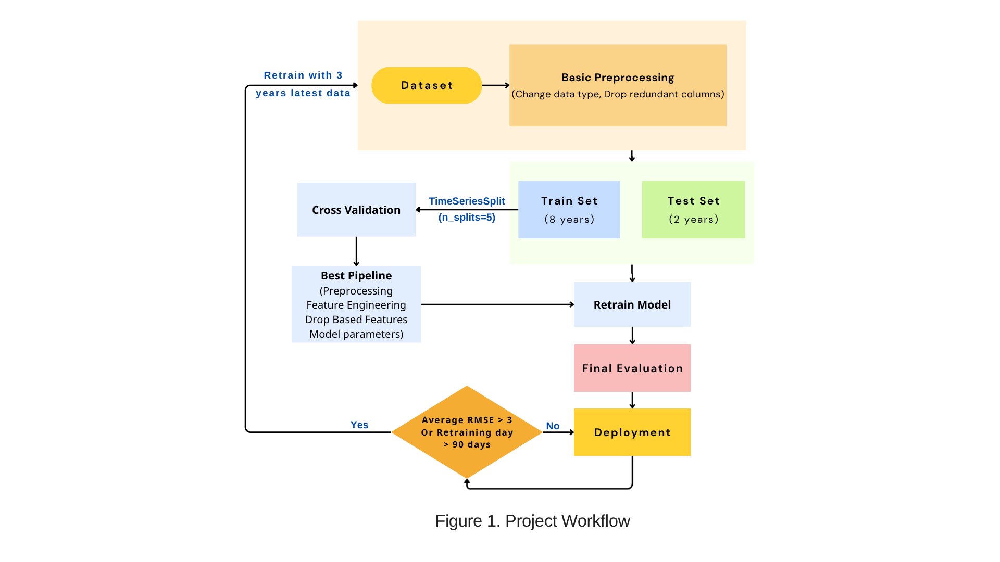

In [93]:

from IPython.display import display
from PIL import Image as PILImage
display(PILImage.open("figures/Project_Workflow.png"))



### **1.3 Project Structure**

The project follows a modular structure designed for scalability and maintainability. Key components include:

- **`data/`** - Contains raw weather datasets from Visual Crossing and processed files for daily predictions and model retraining
- **`assets/`** - UI elements and icons for visualization
- **`logs/`** - Tracking files for model performance metrics and retraining history
- **`models/`** - Save current and updated models/ pipelines
- **`src/`** - Source code modules handling data processing, feature engineering, model training, and deployment
- **Notebooks** - Comprehensive analysis including detailed data understading, model tuning process, and main reporting

*The complete detailed project structure with all subdirectories and files is available in `README.md`.*

---

## **II. Imports and Environment Setup**

In [98]:
# =============================================================================
# 1. Core Libraries & Utilities
# =============================================================================
import os
import random
import numpy as np
import pandas as pd
from pathlib import Path
import joblib
import matplotlib.pyplot as plt
from IPython.display import display
from PIL import Image

# =============================================================================
# 2. Set global seed for reproducibility
# =============================================================================
SEED = 42
random.seed(SEED)
np.random.seed(SEED)

# =============================================================================
# 3. ML Frameworks & Optimization
# =============================================================================
import optuna
import optuna.visualization as vis

from lightgbm import LGBMRegressor
from sklearn.linear_model import Ridge
from sklearn.multioutput import MultiOutputRegressor
from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.base import clone

# =============================================================================
# 4. Experiment Tracking (ClearML)
# =============================================================================
from clearml import Task, Logger

# =============================================================================
# 5. Project Modules (Local Scripts)
# =============================================================================

from src import data_preprocessing as dp
from src import pipeline as pl
from src import new_feature_engineering_daily as fe
from src import feature_selection as fs
from src.model_evaluation import evaluate, evaluate_multi_output
from src.visualization_utils import *

# =============================================================================
# 5. Optuna Sampler (Reproducible)
# =============================================================================
sampler = optuna.samplers.TPESampler(seed=SEED)


---

## **III. Data Understanding**

### **3.1. Dataset Overview**

In [127]:
# load data
df0 = pd.read_csv(r"data\raw data\Hanoi Daily 10 years.csv") 
df0.head(1)

,name,datetime,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,...,solarenergy,uvindex,severerisk,sunrise,sunset,moonphase,conditions,description,icon,stations
0,Hanoi,9/20/2015,33.0,26.7,29.3,41.7,30.5,35.4,25.7,81.5,...,12.2,5,NaN,2015-09-20T05:44:39,2015-09-20T17:55:33,0.23,"Rain, Partially cloudy",Partly cloudy throughout the day with late aft...,rain,"48820099999,48823099999,48825099999,4883109999..."


#### 3.1.1. Dataset Information

*   **Context and Objectives:**
    *   Daily weather observations from Hanoi.
    *   Dataset: VisualCrossing Weather Data (historical + real-time)
    *   Period: 10 years of daily and hourly records (from 09/2015 to 09/2025)
    *   The main project objective: To build a predictive model for the average daily temperature (`temp`).

*   **Data Structure Description:**
    *  Total number of observations (rows): 3,660
    *  Total number of attributes (columns): 33

<div align="center">

| **Column Name** | **Description** | **Example** |
|--------------|-------------|------------------|
| name | The name of the weather observation location. | Hanoi |
| datetime | The date of observation in YYYY-MM-DD format. Each row represents one day. | 2023-01-01 |
| tempmax | The highest air temperature recorded during the 24-hour period (°C). | 21.3 |
| tempmin | The lowest air temperature recorded during the 24-hour period (°C). | 11.1 |
| temp | The average (mean) air temperature for the day, calculated from hourly readings (°C). | 16.9 |
| feelslikemax | The highest perceived temperature of the day, factoring in humidity (Heat Index) and wind (Wind Chill) (°C). | 21.3 |
| feelslikemin | The lowest perceived temperature of the day, factoring in humidity and wind (°C). | 11.1 |
| feelslike | The average perceived temperature for the day, providing an overall sense of comfort (°C). | 16.9 |
| dew | Dew Point: The temperature at which air becomes saturated and water vapor condenses into dew (°C). Higher values indicate more moisture. | 10.4 |
| humidity | The average relative humidity for the day; the amount of water vapor in the air as a percentage of the maximum possible at that temperature (%). | 67.4 |
| precip | The total liquid-equivalent amount of precipitation (e.g., rain) that fell during the day (mm). | 0 |
| precipprob | The probability of precipitation. For historical data, it's 100 if precipitation occurred and 0 if it did not (%). | 0 |
| precipcover | The proportion of time during the day that measurable precipitation was recorded (%). Differentiates between short downpours and long drizzles. | 0 |
| preciptype | The specific type(s) of precipitation that occurred, such as rain, snow, or freezing rain. Only present when precipitation has been recorded. | rain,snow,freezingrain,ice,mixed |
| snow | The total amount of new snow that fell during the day (cm). | 0 |
| snowdepth | The average depth of snow on the ground, accounting for new snow and melting (cm). | 0 |
| windgust | The maximum instantaneous wind speed recorded during a brief surge (km/h). | 20.9 |
| windspeed | The average wind speed for the day (km/h). | 13 |
| winddir | The direction *from which* the wind is blowing, measured in degrees from true north (0° = North, 90° = East). | 332.7 |
| sealevelpressure | Atmospheric pressure adjusted to what it would be at sea level, allowing for standardized comparison between locations (mb). | 1023.7 |
| cloudcover | The average percentage of the sky obscured by clouds throughout the day (%). 0 = clear sky, 100 = overcast. | 28.4 |
| visibility | The average distance at which objects can be clearly seen, affected by fog, haze, etc. (km). | 9.2 |
| solarradiation | The average power (intensity) of solar radiation reaching the surface during the day (W/m²). | 188.8 |
| solarenergy | The total accumulated solar energy received over the entire day (MJ/m²). This is the sum of radiation over time. | 16.3 |
| uvindex | The maximum Ultraviolet (UV) Index value recorded during the day, measuring the strength of sunburn-producing radiation. | 5 |
| severerisk | A numerical rating (0-100%) that quantifies the risk of severe weather events like thunderstorms, hail, or tornadoes. | 10 |
| sunrise | The local time of sunrise in ISO 8601 format (YYYY-MM-DDTHH:MM:SS). | 2023-01-01T06:33:36 |
| sunset | The local time of sunset in ISO 8601 format. | 2023-01-01T17:26:21 |
| moonphase | A value from 0 to 1 representing the moon's phase (0=new moon, 0.5=full moon, 1=next new moon). | 0.3 |
| conditions | A brief text summary of the dominant weather conditions for the day. | Partially cloudy |
| description | A more detailed sentence describing the weather throughout the day. | Partly cloudy throughout the day |
| icon | A text code for a visual icon representing the day's weather. | partly-cloudy-day |
| stations | Identifier codes for the weather station(s) that provided the data. Multiple stations can be aggregated for accuracy. | 48820099999,48823099999 |

</div>


#### 3.1.2. Dataset Statistic Summary 
- The `severerisk` and `preciptype` variables have a high percentage of missing values, at 72.68% and 26.97% respectively, making them strong candidates for removal to avoid introducing significant noise.
- The `snow` and `snowdepth` variables both have a standard deviation of 0, indicating they are constant numerical features. Similarly, the categorical variable `name` contains only a single unique value. 

In [ ]:
display(create_variable_groups_table(df0))
display(generate_enhanced_stats_table(df0))

Variable,Type,Count,Null Count,Null %,Additional Info
datetime,datetime,3660,0,0.00%,Unique: 3660
sunrise,datetime,3660,0,0.00%,Unique: 3660
sunset,datetime,3660,0,0.00%,Unique: 3660
name,categorical,3660,0,0.00%,Unique: 1 | Values: Hanoi(3660)
preciptype,categorical,3660,987,26.97%,Unique: 1 | Values: rain(2673)
conditions,categorical,3660,0,0.00%,"Unique: 6, Top: Rain, Partially clou..."
description,categorical,3660,0,0.00%,"Unique: 35, Top: Partly cloudy throug..."
icon,categorical,3660,0,0.00%,"Unique: 4 | Values: rain(2632), partly-cloudy-day(774), clear-day(178), cloudy(76)"
stations,categorical,3660,0,0.00%,"Unique: 16, Top: 48820099999,48823099..."


,null_count,null_pct,mean,std,min,25%,50%,75%,max
tempmax,0,0.00%,28.46,5.81,8.00,24.10,29.40,33.00,41.90
tempmin,0,0.00%,21.88,4.86,5.90,18.00,23.00,26.00,31.00
temp,0,0.00%,24.84,5.11,7.00,21.00,26.00,28.90,35.50
feelslikemax,0,0.00%,32.54,9.52,8.00,24.10,32.70,41.10,52.50
feelslikemin,0,0.00%,22.64,6.05,2.10,18.00,23.00,26.00,40.40
feelslike,0,0.00%,27.32,7.71,4.60,21.00,26.90,33.80,46.20
dew,0,0.00%,20.43,5.84,-2.00,16.70,22.40,25.20,28.50
humidity,0,0.00%,78.26,10.91,31.00,72.10,79.90,85.90,100.00
precip,0,0.00%,5.23,16.03,0.00,0.00,0.22,2.50,333.12
precipprob,0,0.00%,71.91,44.95,0.00,0.00,100.00,100.00,100.00


#### 3.1.3. Correlation Analysis

<div align="center">

| **Correlation Level** | **Feature** | **Correlation with Target (`temp`)** | **Meteorological Interpretation** |
|-----------------------|-------------|--------------------------------------|-----------------------------------|
| **Very High Positive** | `tempmax`, `tempmin`, `feelslikemax`, `feelslikemin`, `feelslike`, `dew` | > 0.85 | Direct temperature-related measurements; dew point closely tracks air temperature |
| **High Positive** | `solarradiation`, `solarenergy`, `uvindex` | 0.60 - 0.80 | Solar energy inputs directly influence atmospheric heating |
| **Strong Negative** | `sealevelpressure` | < -0.70 | Higher pressure typically associated with cooler, drier air masses |
| **Moderate Negative** | `humidity`, `cloudcover` | -0.40 to -0.60 | Increased moisture and cloud coverage reduce solar heating efficiency |

**Table 1: Correlation with Target Variable**

</div>

<div align="center">

| **Feature Cluster** | **Variables** | **Correlation Range** | **Impact & Recommendation** |
|---------------------|---------------|------------------------|----------------------------|
| **Temperature Cluster** | `temp`, `tempmax`, `tempmin`, `feelslike`, `feelslikemax`, `feelslikemin`, `dew` | > 0.85 | High multicollinearity; consider feature selection to retain only 2-3 key temperature indicators |
| **Precipitation Cluster** | `precip`, `precipprob`, `precipcover` | 0.70 - 0.90 | Strong inter-dependence; select one representative precipitation metric |
| **Solar Energy Cluster** | `solarradiation`, `solarenergy` | > 0.95 | Near-perfect correlation; retain only one variable to avoid redundancy |

**Table 2: Multicollinearity Analysis**

</div>

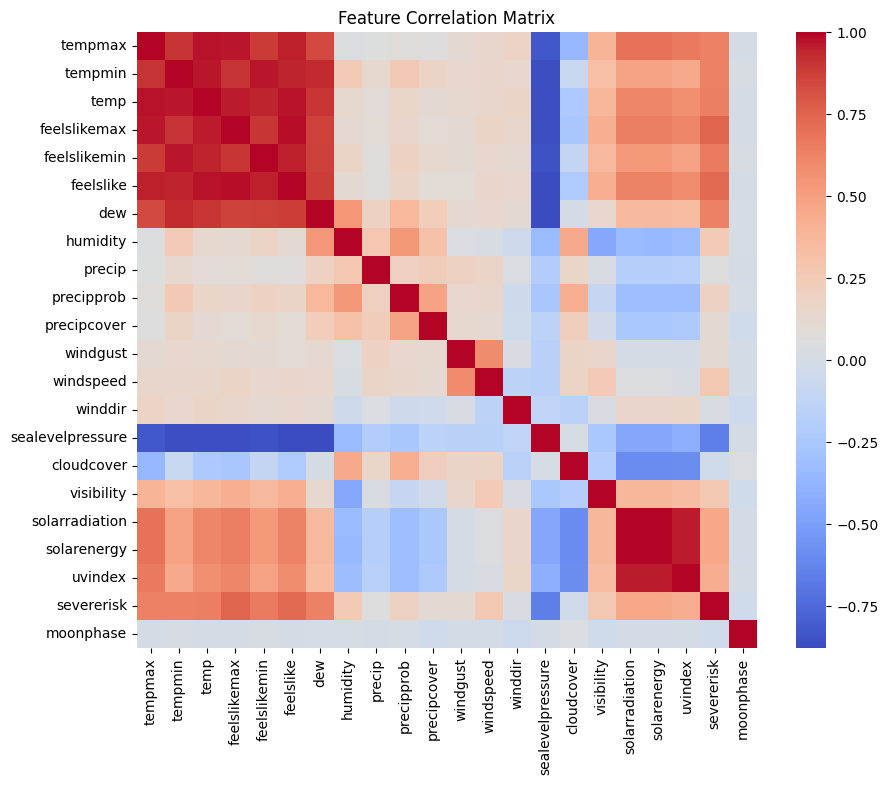

In [ ]:
plot_corr_heatmap(df0)


### **3.2. Target Variables Analysis (temp)**
### 3.2.1. Warming Trend
The data reveals a clear warming trend in Hanoi's yearly average temperature over the decade, with the average rising from approximately $23.7^{\circ}C$ in 2015 to over $25.1^{\circ}C$ in 2025. Notably, the *hottest year recorded was 2019*, peaking at $25.25^{\circ}C$, followed by a cooling period in 2022 before temperatures sharply recovered and stabilized at a high level.

**Suggestion**
>The long-term warming trend does not directly determine 5-day forecasts, but it shifts the overall temperature baseline over the years. <br>
>For stable short-term forecasting, we consider using:
<br>• Trend-related signals: time index like **year**, **day_number** features
<br>• Short-term dynamics: **lag** features and **rolling** statistics


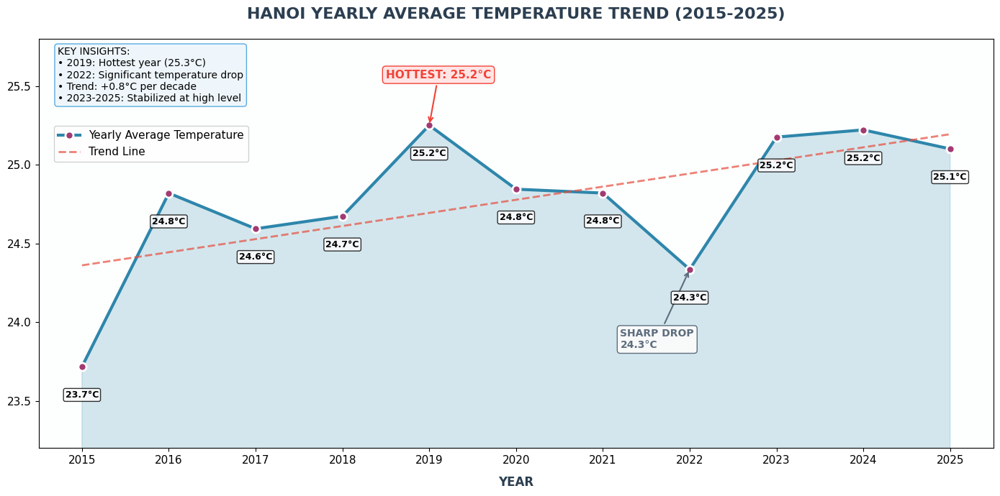

In [ ]:
plot_yearly_temperature(df0)

### 3.2.2. Seasonality
This chart perfectly illustrates Hanoi's distinct bimodal temperature cycle, which aligns with Vietnam's seasonal climate in the North. **Summer (June-August) is the peak heat** period, with the average temperature soaring to its maximum of $30.3^{\circ}C$ in June, and remaining above $29^{\circ}C$ through August. Conversely, the **Cool/Dry Winter (December-February)** is defined by its lowest temperatures, with January averaging only $17.9^{\circ}C$. The transitions in **Spring (March-April) and Autumn (September-November)** show a steady and rapid warming/cooling, with October still registering a warm $25.9^{\circ}C$ before the steep drop into winter.

**Suggestion**
>* Transition Indicators: is_rapid_warming (Mar-May), is_rapid_cooling (Sep-Nov) for fast temperature increase/ descrease phase
>* Cyclical Time Features: Sine/Cosine transformations of month for smooth seasonal patterns

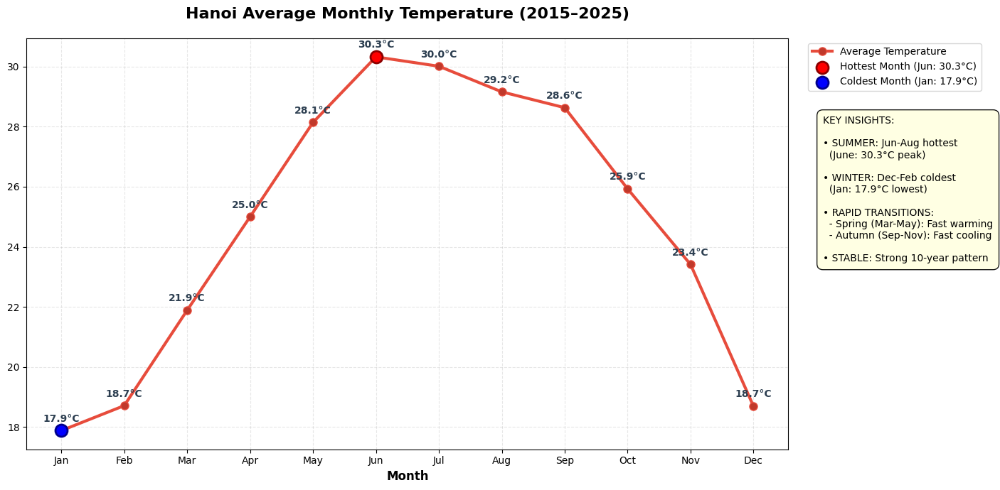

In [ ]:
plot_month_average(df0)

### 3.2.3. Temperature Volatility 

The chart uses 5-day rolling standard deviation to measure short-term temperature fluctuations. **Winter** has the highest average volatility (>2°C), peaking at 5°C due to cold fronts, while **Summer** has Lowest volatility (~1°C), indicating stable temperatures. Spring and Autumn show Moderate fluctuations

**Suggestion**
>* Volatility-based features: 5-day rolling mean ± rolling STD as additional inputs
>* Lag features: Past 1–7 day temperatures help capturing trend and sudden changes
>* Season features: extract month or grouping months into seasons

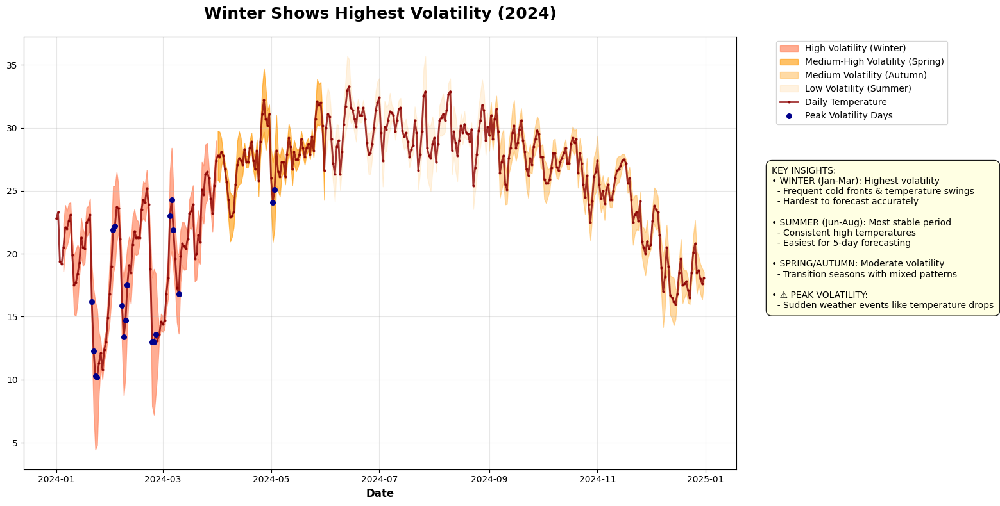

In [ ]:
plot_volatility_customized(df0)

### **3.3. Key Feature Groups** 

A comprehensive analysis of all 33 variables has been conducted in `FINAL-DATA_UNDERSTANDING_FIXED_1.ipynb`.This section focuses only on the most influential features for temperature forecasting.

### **3.3. Key Features**

#### **3.3.1. Feels Like Temperature (°C)**

**A. Domain Knowledge:**
- **Definition:** Perceived temperature on human skin, accounting for **humidity** and **wind speed** effects on thermal comfort
- **Underlying Principles:**
  - Heat Index (Hot): High humidity reduces sweat evaporation efficiency
  - Wind Chill (Cold): Wind accelerates heat loss from skin
- **Calculation:** Derived from formulas combining temperature, humidity, and wind speed measurements

**B. Calculation Formulas:**
1. Heat Index (Hot/Humid):
   $$
   \text{FeelsLike} \approx T + f(\text{RH})
   $$
2. Wind Chill (Cold/Windy):
   $$
   \text{FeelsLike} \approx 13.12 + 0.6215T - 11.37V^{0.16} + 0.3965TV^{0.16}
   $$
3. Mild Conditions: `feelslike` ≈ actual temperature

**C. Seasonal Patterns in Hanoi:**

<div align="center">

| **Season** | **Period** | **Pattern** | **Interpretation** |
|------------|------------|-------------|-------------------|
| **Hot & Humid** | May-Sep | `feelslike` > `temp` by 5-10°C | Heat Index dominant; high humidity impedes cooling |
| **Transitional** | Oct-Dec | `feelslike` ≈ `temp` | Balanced conditions; pleasant "hanh khô" weather |
| **Cool & Dry** | Jan-Apr | Variable gaps | Mixed Wind Chill and mild condition effects |

</div>

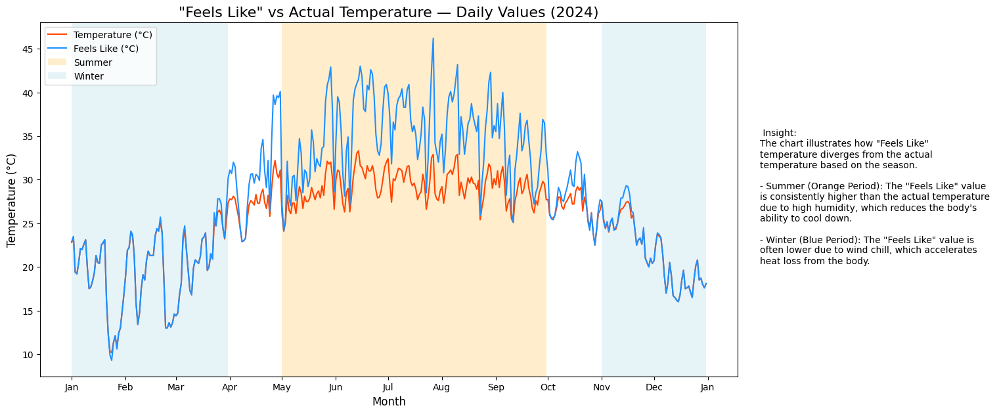

In [ ]:
plot_temp_feelslike_2024(df0)


#### **3.3.2. Dew Point (`dew`)**

**A. Domain Knowledge:**  
The **dew point** represents the temperature at which air becomes saturated with water vapor, leading to condensation. It serves as a critical indicator of atmospheric moisture content and plays a key role in fog formation, cloud development, and human comfort perception.

**B. Measurement & Calculation:**
- **Units:** °C (measured via hygrometers)
- **Formula:** Magnus Approximation  
  `Td = T – ((100 – RH) / 5)`  
  *Where:*  
  - `Td`: Dew point temperature (°C)  
  - `T`: Air temperature (°C)  
  - `RH`: Relative humidity (%)

**C. Physical Interpretation:**
- **Temperature Floor:** Dew point establishes the minimum temperature threshold before condensation occurs
- **Humidity Indicator:** The gap between air temperature and dew point visually represents relative humidity:
  - **Narrow gap** → High humidity (humid, damp conditions)
  - **Wide gap** → Low humidity (dry conditions)

**D. Regional Climate Patterns (Northern Vietnam):**
- **Humid Season ("Nồm"):** Late winter to early spring (Feb-Apr)  
  *Characteristics:* Moist sea air influx, persistent drizzle, fog, surface condensation
- **Dry Season ("Mùa khô hanh"):** October to January  
  *Characteristics:* Cold, dry northeastern monsoons from Siberia, low humidity, cool temperatures

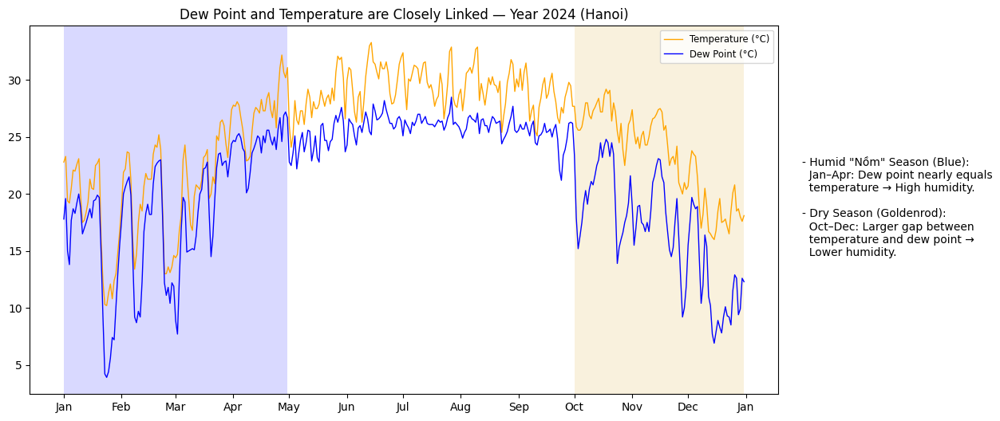

In [ ]:
plot_temp_dewpoint_2024(df0)


### **3.3.3. Wind Direction (`winddir`)**

**A. Domain Knowledge:**  
Wind direction indicates the **compass direction from which the wind originates**, providing crucial insights into air mass movements, weather system tracking, and regional climate patterns.

**B. Measurement Methods:**
- **Traditional:** Weather vanes (mechanical direction indicators)
- **Modern:** Ultrasonic anemometers (sonic pulse time-of-flight analysis)
- **Remote Sensing:** Satellite-based cloud and vapor tracking
- **Model Data:** Reanalysis products (ERA5) integrating multiple data sources
- **Daily Aggregation:** Vector averaging or modal calculation from hourly observations

**C. Units & Conventions:**
- **Primary:** Degrees (°) from true North (0°/360° = N, 90° = E, 180° = S, 270° = W)
- **Alternative:** Cardinal directions (NE, SW, etc.) for general reporting

**D. Vector Averaging Formula:**
Due to the circular nature of directional data, daily averages require vector component calculation:

$$
\begin{align}
\bar{u} &= \frac{1}{N} \sum_{i=1}^{N} -s_i \sin(\theta_i) \quad \text{(East-West component)} \\
\bar{v} &= \frac{1}{N} \sum_{i=1}^{N} -s_i \cos(\theta_i) \quad \text{(North-South component)} \\
\text{winddir}_D &= \arctan2(\bar{u}, \bar{v}) \times \frac{180}{\pi} + 180
\end{align}
$$

**Where:**
- $\text{winddir}_D$: Daily average wind direction
- $\theta_i$: Wind direction in degrees at observation $i$
- $s_i$: Wind speed at observation $i$
- $N$: Number of observations

**E. Meteorological Significance:**
- **Air Mass Tracking:** Identifies origin of incoming weather systems
- **Seasonal Patterns:** Monsoon directions, sea breeze cycles
- **Local Effects:** Valley flows, urban ventilation patterns

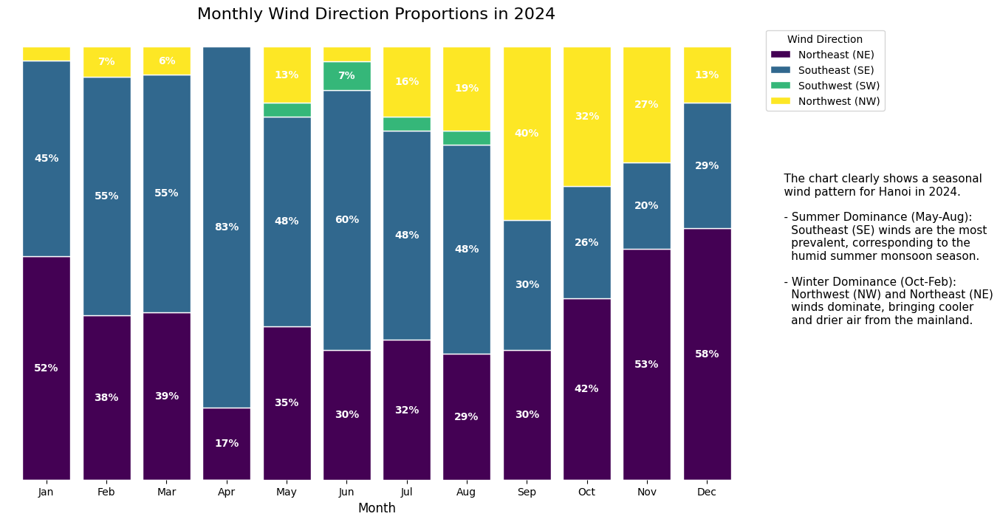

In [ ]:
plot_wind_distribution(df0)


### **3.3.4. Solar Radiation (`solarradiation`)**

**A. Domain Knowledge:**  
Solar radiation represents the electromagnetic energy emitted by the Sun that reaches Earth's surface, serving as the primary driver of atmospheric processes, temperature patterns, and energy balance in the climate system.

**B. Measurement Units:**
- **Primary Unit:** Watts per square meter (W/m²) - instantaneous power density
- **Cumulative Energy:** Joules per square meter (J/m²) - total energy over time
- **Reference Value:** Solar constant ≈ 1,361 W/m² (extraterrestrial radiation)

**C. Radiation Components & Formulas:**

<div align="center">

| Formula | Equation | Parameters |
|---------|----------|------------|
| **Total Radiation Accumulation** | `H = I × t` | • **H**: Total radiation energy (J/m²)<br>• **I**: Irradiance intensity (W/m²)<br>• **t**: Time duration (seconds) |
| **Global Horizontal Irradiance** | `E_g = E_d + E_b cos(z)` | • **E_g**: Global solar irradiance on horizontal surface (W/m²)<br>• **E_d**: Diffuse irradiance (W/m²)<br>• **E_b**: Direct beam irradiance (W/m²)<br>• **z**: Solar zenith angle |

</div>

**D. Meteorological Significance:**
- **Primary Heating Source:** Direct driver of diurnal temperature cycles
- **Energy Balance:** Critical component of surface energy budget calculations
- **Weather Patterns:** Influences cloud formation, evaporation rates, and atmospheric stability
- **Seasonal Variation:** Dependent on solar altitude, day length, and atmospheric conditions

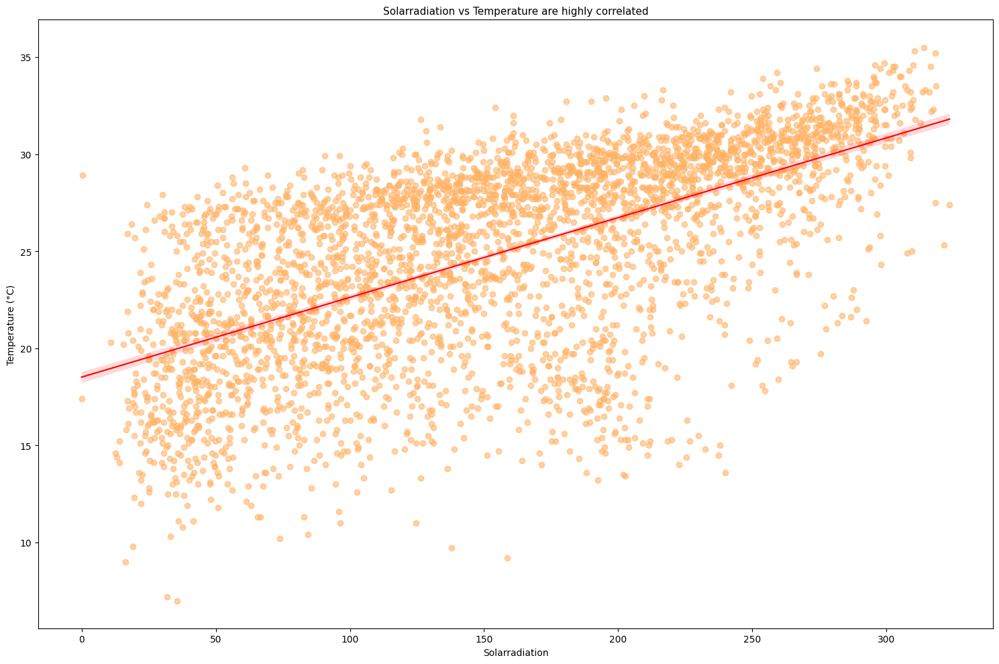

In [ ]:
solar(df0)

### **3.3.5. Weather Icon (`icon`)**

**A. Feature Description:**  
Categorical variable providing simplified daily weather summaries (e.g., 'rain', 'partly-cloudy-day', 'clear-day', 'cloudy') that encapsulate complex atmospheric conditions into intuitive visual categories.

**B. Meteorological Analysis:**  
The icon feature demonstrates a **dynamic, cyclical relationship** with temperature patterns, particularly evident during Hanoi's tropical monsoon season (May-July):

**C. Monsoon Cycle Pattern:**

1.  **Heating Phase:** Days begin hot under `partly-cloudy-day` conditions and progress to `clear-day` or `cloudy` skies, where intense solar radiation (often amplified by Lao winds) drives temperatures to their peak (32-35°C).
2.  **Convective Rainfall:** The accumulated daytime heat triggers strong convection, leading to afternoon thunderstorms, which are logged under the `rain` icon.
3.  **Cooling Phase:** These storms dissipate the heat, causing a sharp drop in temperature.

**D. Modeling Considerations:**
- **Redundancy Risk:** Derivative feature potentially captured by fundamental variables (`cloudcover`, `humidity`, precipitation)
- **Seasonal Specificity:** Strong monsoon patterns may not generalize across annual dataset
- **Information Value:** Encodes weather narratives but may introduce temporal bias
- **Recommended Approach:** Evaluate against raw meteorological measurements for feature selection

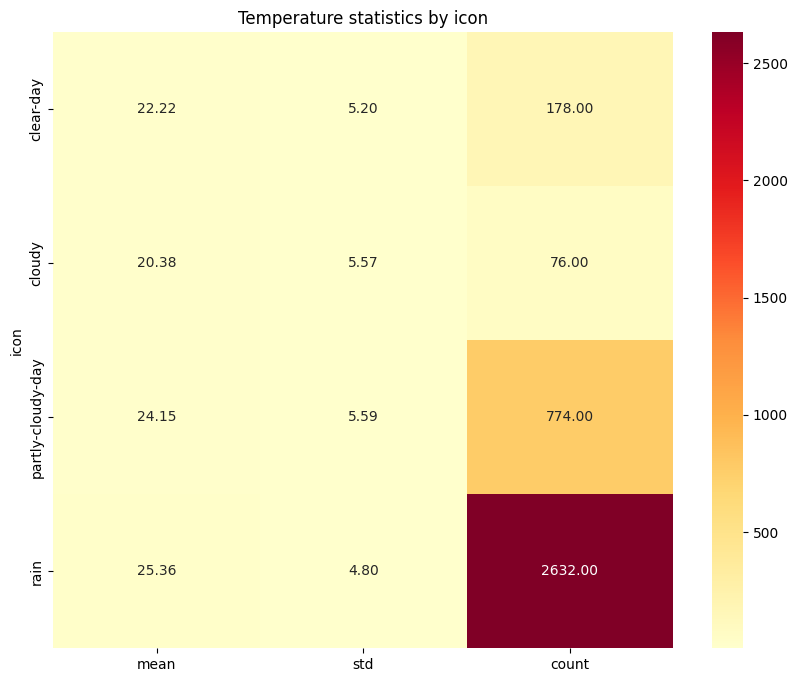

In [129]:
# icon and temp
display(PILImage.open("figures\icon.png"))

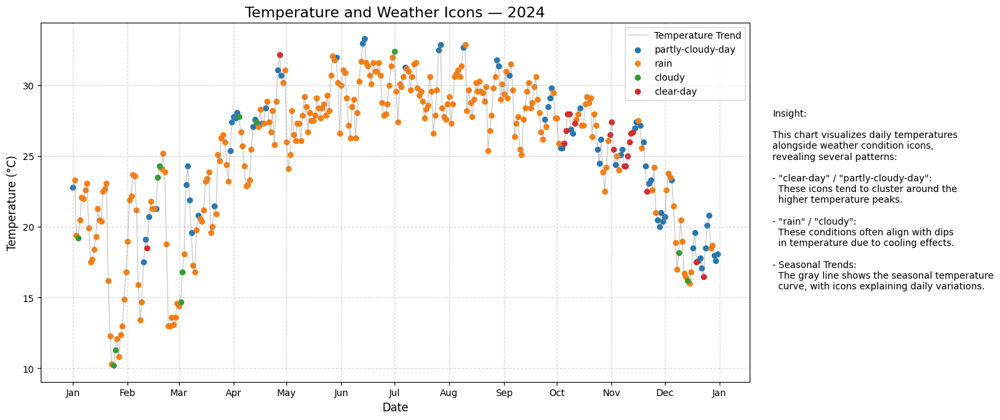

In [ ]:
plot_temp_icon_2024(df0)

### **3.4. Feature Elimination**
### 3.4.1. Initial Dropping

The following features were identified as redundant or non-informative and were removed to simplify the model.

<div align="center">

<table>
<thead>
<tr>
    <th>Feature</th>
    <th>Reason for Removal</th>
    <th>Dropping Stage</th>
</tr>
</thead>

<tbody>

<!-- BASIC PREPROCESSING -->
<tr>
    <td>`name`</td>
    <td>Forecast in Hanoi only</td>
    <td rowspan="5"><b>Basic Preprocessing<br>(apply before splitting)</b></td>
</tr>
<tr>
    <td>`precipprob`</td>
    <td>Binary-like (0/100%), redundant because `precip` already indicates rain/no rain</td>
</tr>
<tr>
    <td>`description`</td>
    <td>Detailed version of `conditions`, redundant</td>
</tr>
<tr>
    <td>`icon`</td>
    <td>Derived from other features, already contained in `conditions`</td>
</tr>
<tr>
    <td>`stations`</td>
    <td>Main station is VVNB, adds no new information</td>
</tr>

<!-- PREPROCESSING -->
<tr>
    <td>`preciptype`</td>
    <td>Only "rain" or null, redundant because `precip` already captures rainfall presence</td>
    <td rowspan="3"><b>Preprocessing<br>(apply after splitting)</b></td>
</tr>
<tr>
    <td>`snow`, `snowdepth`</td>
    <td>Only contain 0 value</td>
</tr>
<tr>
    <td>`severerisk`</td>
    <td>Over 70% missing values</td>
</tr>

</tbody>
</table>

</div>




### 3.4.2. Dropping Based Features
After **Feature Engineering**, original base features were removed to avoid redundancy and let the model focus on more informative derived features.

---

## **IV. Data Preprocessing**

### **4.1. Data Preparing**

We use function `prepare_data()` from file `data_preprocessing.py`
<div align="center">

| Step Name | Output Description |
|-----------|-------------------|
| **Data Cleaning** | Removed redundant columns (description, icon, stations, name), reducing features from 33 to 27 |
| **Train-Test Split** | 80% training (2928 samples) and 20% testing (732 samples) |
| **Multi-Target Setup** | Created 5 target variables for next 1-5 day temperature forecasts |
| **Splitting X and y** | X_train (2923, 27), X_test (727, 27)<br> y_train (2923, 5), y_test (727, 5) |

</div>

In [ ]:
df, train_df, test_df, X_train, y_train, X_test, y_test = dp.prepare_data(is_print= True)

Step 1: Load Raw Data
→ Initial data shape: (3660, 33)

Dropped column: 'description'
Dropped column: 'precipprob'
Dropped column: 'icon'
Dropped column: 'stations'
Dropped column: 'name'
Step 2: Basic Preprocessing
→ Data shape after removing redundant columns: (3660, 27)

Step 3: Split Train/Test Sets (80/20)
→ Train shape: (2928, 27)
→ Test  shape: (732, 27)

Step 4: Create Multi-Target Variables
→ Created targets: ['temp_next_1', 'temp_next_2', 'temp_next_3', 'temp_next_4', 'temp_next_5']
→ Multi-target creation completed successfully.

Step 5: Split Features (X) and Targets (y)
→ X_train shape: (2923, 27)
→ y_train shape: (2923, 5)
→ X_test  shape: (727, 27)
→ y_test  shape: (727, 5)


### **4.2. Preprocessing**

Preprocessing is conducted using `build_preprocessing_pipeline()` from `pipeline.py`. The pipeline is fitted exclusively on training data to prevent data leakage.

*This preprocessing module will later be integrated into the complete modeling workflow via `build_full_pipeline()`.*

**Pipeline Architecture:**
<div align="center">

| Step Name | Description | Output Description |
|-----------|-------------|--------|
| **missing** | Drop columns with >10% missing values, else impute by median or mode | Drop 2 features (severerisk, preciptype) |
| **drop_low_var** | Remove zero-variance numeric features | Drop 2 features (snow, snowdepth) |
| **drop_cate** | Drop high-cardinality categorical features or features with only 1 unique value | No columns dropped |
| **object_to_category** | Convert object dtype to category dtype | Convert conditions to category dtype |

</div>

In [6]:
X_train_processed, X_test_processed = dp.run_preprocessing(X_train,X_test,y_train,y_test, pl.build_preprocessing_pipeline)

Step 6: Preprocessing 
→ X_train shape after preprocessing: (2923, 23)
→ y_train shape after preprocessing: (2923, 5)
→ X_test shape after preprocessing: (727, 23)
→ y_test shape after preprocessing: (727, 5)


---

## **V. Feature Engineering**
Based on the **key insights** identified during the Data Understanding phase, we designed and created new features that capture important patterns in the weather data


### **5.1. Temporal Features Engineering (`def create_date_features`)** 

Temporal features capture meteorological patterns exhibiting strong **seasonality**, **cyclic behavior**, and **repeating trends**, enabling models to learn periodic weather patterns effectively.

<div align="center">

| Feature Category | Features Generated | Purpose & Meteorological Significance |
|------------------|-------------------|--------------------------------------|
| **Current Day Time Features** | `month`, `weekday`, `day_of_year`, `is_weekend` | Capture long-term seasonal behaviors, weekly cycles, and temporal trends in weather patterns |
| **Cyclical Encoding** | `month_sin`, `month_cos`, `day_sin`, `day_cos` | Preserve cyclical nature of time (December close to January) for effective periodic pattern learning |
| **Future Horizon Features** | `month_h1`→`h5`, `weekday_h1`→`h5`, `day_of_year_h1`→`h5` with sine-cosine encodings | Provide explicit future temporal context for multi-step forecasting (1-5 days ahead) |
| **Solar Cycle Features** | `sunrise`, `sunset` (hour-of-day), `day_length`, `sunrise_sin/cos`, `sunset_sin/cos` | Capture seasonal astronomical effects influencing temperature variation, solar radiation, and diurnal thermal differences |

</div>

**Engineering Rationale:**
- **Multi-step Forecasting:** Future temporal features essential as models cannot infer upcoming temporal context
- **Cyclical Preservation:** Sine-cosine encoding maintains temporal continuity across period boundaries
- **Seasonal Patterns:** Solar features encode astronomical influences on meteorological conditions
- **Temporal Context:** Comprehensive time representation supports stable and accurate weather predictions


### **5.2. Weather Feature Engineering  (`def create_specific_features`)**

Domain-knowledge features designed to better describe physical weather system behavior, providing more informative signals than raw meteorological measurements.

<div align="center">

| Feature Category | Features Generated | Purpose & Meteorological Significance |
|------------------|-------------------|--------------------------------------|
| **Temperature Dynamics** | `temp_range`, `dew_spread` | Captures diurnal temperature volatility and humidity saturation levels for stability assessment |
| **Precipitation & Moisture** | `humidity_high`, `heavy_rain`, `rain_intensity`, `moisture_index`, `vis_humidity_index`, `humid_foggy_day` | Quantifies rainfall intensity, moisture saturation, visibility degradation, and foggy conditions |
| **Atmospheric Interactions** | `wind_temp_index`, `pressure_temp_index`, `humidity_cloud_index`, `solar_temp_index`, `temp_humidity_interaction`, `wind_temp_interaction`, `temp_dew_interaction` | Encodes pairwise physical relationships for linear models (temperature-humidity, wind-pressure effects) |
| **Thermal Comfort** | `heat_index`, `wind_chill`, `thermal_index` | Represents perceived temperature accounting for humidity (heat index) and wind effects (wind chill) |
| **Wind & Lunar Patterns** | `wind_variability`, `winddir_cos/sin`, `wind_category`, `moonphase_sin/cos` | Captures wind gustiness, directional patterns, and subtle lunar cycle influences |
| **Solar & Visibility** | `uv_cloud_index`, `solar_visibility_index` | Models sky clarity, illumination effects, and visibility-cloud cover relationships |

</div>

**Engineering Strategy:**
- **Physical Relationships**: Features encode known meteorological interactions and comfort indices
- **Conditional Logic**: Thermal indices adapt to temperature regimes (hot/cold/moderate)
- **Linear Model Support**: Interaction terms specifically for models requiring explicit feature engineering
- **Cyclical Encoding**: Wind direction and moon phase transformed for continuous understanding
- **Extreme Events**: Flags for heavy rain and high humidity capture significant weather patterns

**Feature Selection**: Atmospheric interactions activated only for linear models (`is_linear=True`) as tree-based models can derive these relationships implicitly.

### **5.3. Rolling Features (`def create_rolling_features`)**

<div align="center">

| Aspect | Configuration & Implementation |
|--------|-------------------------------|
| **Design Principle** | Shift series by 1 step before rolling to prevent data leakage, applying multiple window sizes and statistics |
| **Window Strategy** | Short (3-5 days): Recent conditions<br>Medium (7 days): Weekly patterns<br>Long (14-21 days): Seasonal trends |
| **Statistics Computed** | `mean` (local average), `std` (volatility), `sum` (accumulation) |
| **Key Variables** | `temp`, `humidity`, `precipitation`, `wind_category`, `solarradiation`, `cloudcover`, `thermal_indices` |

</div>

**Meteorological Interpretation:**
Rolling features enable the model to analyze:
- **Recent Trends**: "Has temperature been steadily increasing over past days?"
- **Volatility Patterns**: "How variable has wind speed been recently?" 
- **Accumulation Effects**: "How much rain has accumulated in past 7-14 days?"
- **Regime Changes**: "Are we in a persistent heat wave or rainy period?"


### **5.4. Lag Features (`def auto_create_lag_features`)** 

<div align="center">

| Aspect | Configuration & Implementation |
|--------|-------------------------------|
| **Design Motivation** | Capture autoregressive nature of weather variables where current conditions depend on recent history (temperature persistence, humidity memory, wind pattern evolution) |
| **Lag Configuration** | `dew`, `humidity`, `precip`, `windgust`, `cloudcover`, `visibility`: [1, 2, 3, 7]<br>`windspeed`: [1, 3, 7, 30]<br>`winddir_cos/sin`: [1, 3, 7]<br>Temperature variables: [1, 2, 3]<br>Lunar/solar variables: [7, 14] |
| **Time Scale Coverage** | Short-term (1-3 days): Local persistence<br>Weekly (7 days): Periodic patterns<br>Long-term (14-30 days): Slow-evolving phenomena |
| **Feature Naming** | `{feature}_lag_{k}` (e.g., `temp_lag_1`, `humidity_lag_3`, `windspeed_lag_30`) |
| **Implementation** | Check column existence → Generate shifts → Efficient concatenation preserving original data |

</div>

**Meteorological Interpretation:**
Lag features enable the model to analyze:
- **Persistence Patterns**: "Today's temperature is similar to yesterday's"
- **Gradual Evolution**: "Wind and cloud patterns develop over multiple days"
- **Periodic Behavior**: "Weekly humidity cycles or seasonal pressure patterns"
- **Memory Effects**: "Prolonged wet/dry spells influencing current conditions"


### **5.5. Encoding Category Features (`def build_encoding_pipeline`)** 

This section outlines the transformation of categorical weather features into model-friendly representations through wind direction categorization and encoding pipeline logic.

<div align="center">

| Component | Function & Configuration | Purpose & Methodology |
|-----------|--------------------------|----------------------|
| **Wind Direction Categorization** | `categorize_wind_direction()`<br>Raw `winddir` (0°-360°) → `wind_category` | Groups degrees into meteorological sectors (N, NE, SE, S, SW, W, NW) to reduce noise and create meaningful wind behavior classes |
| **Encoding Pipeline Control** | `build_encoding_pipeline()`<br>Parameters: `is_category_conditions`, `is_category_season`, `is_category_wind` | Provides flexible encoding strategy selection (target, ordinal, quantile) or categorical preservation based on model requirements |
| **Weather Conditions Encoding** | `ConditionsEncoder`<br>Input: `conditions` (Rain, Fog, Partly cloudy) | Converts high-cardinality weather labels using target-aware methods to avoid one-hot explosion while preserving target relationships |
| **Season Classification** | `SeasonClassifier`<br>Clusters months into `n_seasons` based on temperature | Creates data-driven seasonal groupings reflecting actual climate patterns rather than arbitrary calendar boundaries |
| **Wind Category Encoding** | `WindCategoryEncoder`<br>Input: `wind_category` from categorization | Transforms wind sectors into numeric representations (quantile bins) or preserves as categorical based on model type |

</div>

**Encoding Strategy Matrix:**

| Feature | Categorical Output (`is_category=True`) | Numerical Output (`is_category=False`) |
|---------|----------------------------------------|--------------------------------------|
| **Weather Conditions** | Preserved as category dtype | Target encoding, ordinal encoding, or quantile-based encoding |
| **Season Classification** | Seasonal categories as category dtype | Numeric season IDs (0, 1, 2, ...) |
| **Wind Categories** | Wind sectors as category dtype | Quantile-based numeric mapping |

**Technical Implementation:**
```python
# Encoding pipeline configuration
encoding_pipeline = Pipeline([
    ("conditions_encoder", ConditionsEncoder(method='target')),
    ("season_classifier", SeasonClassifier(n_seasons=4)),
    ("wind_encoder", WindCategoryEncoder(n_quantiles=4))
])

### **5.6. Dropping Based Features (`def drop_base_features`)** 

After feature engineering, original base columns are removed to optimize the feature space by eliminating redundancy, reducing multicollinearity, and simplifying the dataset for modeling.

<div align="center">

| Base Feature Removed | Engineered Replacement | Rationale for Removal |
|---------------------|------------------------|----------------------|
| `winddir` | `winddir_sin`, `winddir_cos`, `wind_category` | Circular discontinuity issue resolved by cyclical encoding and categorical grouping |
| `conditions` | Encoded representations from pipeline | Text labels inconsistent; encoded versions capture target relationships better |
| `sunrise`, `sunset` | Hour values, `day_length`, cyclical encodings | Raw timestamps variable; derived features provide more meaningful temporal signals |
| `moonphase` (raw) | `moonphase_sin`, `moonphase_cos` | Circular nature better represented by trigonometric transformations |
| `heat_index`, `wind_chill` | Unified `thermal_index` | Special-case metrics consolidated into continuous, comprehensive representation |
| `dewpoint`, `snow`, `solarenergy`, `severerisk` | N/A (no direct replacements) | Unused, highly sparse, or inconsistent variables adding noise without predictive value |

</div>

**Removal Strategy Benefits:**

| Benefit | Impact on Model Performance |
|---------|----------------------------|
| **Redundancy Elimination** | Prevents duplicate information and conflicting signals from engineered vs base features |
| **Multicollinearity Reduction** | Improves model stability by removing correlated predictors that can destabilize coefficients |
| **Feature Space Simplification** | Reduces dimensionality for faster training and lower risk of overfitting |
| **Noise Reduction** | Eliminates sparse or inconsistent variables that contribute minimal predictive value |


---

## **VI. Full Pipeline** 

### **6. Unified Machine Learning Pipeline**

#### **6.1. Strategic Importance of Pipeline Architecture**

Transitioning from ad-hoc scripting to a structured pipeline is fundamental for building robust, reproducible, and deployable machine learning systems. The `build_full_pipeline` function encapsulates the entire data transformation workflow into a single, configurable object with strategic advantages:

<div align="center">

| Advantage | Impact & Rationale |
|-----------|-------------------|
| **Data Leakage Prevention** | Encapsulates preprocessing steps to learn parameters only from training data, ensuring validation/test transformations use fitted parameters without refitting |
| **Methodological Integrity** | Serves as executable "recipe" eliminating manual step errors and ensuring reproducible feature engineering across team members |
| **Streamlined Experimentation** | Enables seamless hyperparameter tuning with tools like GridSearchCV, optimizing both preprocessing choices and model parameters simultaneously |
| **Deployment Readiness** | Serialized pipeline object can process new raw data with identical logic used during training, simplifying production deployment |

</div>

#### **6.2. Pipeline Architecture Overview**

The `build_full_pipeline` orchestrates four sequential stages, each transforming the input DataFrame in a controlled manner:

<div align="center">

| Stage | Component | Key Transformers | Input → Output State |
|-------|-----------|------------------|---------------------|
| **1. Foundational Preprocessing** | `preprocessing` | `HandleMissing`, `DropLowVariance`, `DropCategorical`, `To_Category` | Raw DataFrame → Cleaned, reduced columns with efficient data types |
| **2. Feature Engineering** | `feature_engineering` | `create_date_features`, `create_specific_features`, `auto_create_lag_features`, `create_rolling_features` | Cleaned data → High-dimensional feature set with temporal, domain-specific, and statistical features |
| **3. Advanced Encoding** | `encoding` | `ConditionsEncoder`, `SeasonClassifier`, `WindCategoryEncoder` | Feature-rich data → Target-aware numerical representations preserving categorical semantics |
| **4. Feature Refinement** | `drop_base` | `DropBaseFeature` | Encoded DataFrame → Final model-ready feature set with redundant base features removed |

</div>

#### **6.3. Stage-Specific Technical Implementation**

**Stage 1: Data Preprocessing**
- **Objective**: Establish baseline data quality and structural integrity
- **Key Operations**: Remove high-nullity columns, eliminate zero-variance features, filter high-cardinality categoricals, optimize data types for computational efficiency

**Stage 2: Feature Enrichment** 
- **Temporal Features**: Calendar decomposition, cyclical encoding, future horizon context
- **Domain Knowledge**: Thermodynamic indices, precipitation intensity, thermal comfort metrics
- **Statistical Features**: Lag variables for autocorrelation, rolling statistics for trend analysis

**Stage 3: Encoding Category**
- **Target-Aware Strategy**: Leverages temperature relationships for predictive encoding
- **Flexible Output**: Numerical formats or category dtype based on `is_category` parameter
- **Climate-Adaptive**: Data-driven season clustering specific to Hanoi's meteorological patterns

**Stage 4: Dimensionality Optimization**
- **Redundancy Elimination**: Remove original features superseded by engineered versions
- **Multicollinearity Reduction**: Mitigate correlation issues for model stability
- **Feature Space Finalization**: Deliver optimized input set for model training

**Engineering Outcome**: The pipeline transforms raw meteorological data into a sophisticated feature representation that captures temporal patterns, physical relationships, and climate-specific characteristics essential for accurate temperature forecasting.

---

## **VII. Modeling and Tuning**

### **7.1  Forecasting Architectures Overview**

<div align="center">

| **Strategy** | **Description** | **Drawbacks** | **When to Use** |
|---------------|-----------------|----------------|-----------------|
| 1. Recursive | Train one model for one-step-ahead forecasting (t+1), then feed predictions back into the model to forecast further steps (t+2 → t+5). | High **error accumulation** — each prediction error propagates into future steps. | Suitable for **short-term** forecasts or stable systems where small errors don’t compound significantly. |
| 2. Multi-Output | Use a single model (e.g., MultiOutputRegressor or built-in multi-output models) to predict multiple horizons (t+1 → t+5) simultaneously. | A “**generalist**” model — efficient but may not optimize each horizon equally well. | When **computational efficiency** and simultaneous multi-horizon outputs are prioritized over horizon-specific accuracy. |
| **3. Direct (Final Approach)** | Train **independent models** for each horizon (e.g., separate tuning/training loop for t+1 → t+5). Each model specializes on one specific forecast distance. | Requires training multiple models (higher computational cost). | When **accuracy, robustness**, and horizon-specific specialization are key priorities. |

</div>



### **7.2. Evaluation Metrics**

We evaluate our forecasting models using three key regression metrics: **MAE**, **RMSE**, and **R²**.  
Each provides a unique view of performance — together they ensure a complete evaluation.

<div align="center">

| Metric | Formula | Interpretation | Characteristics | Our Usage |
|:--------|:----------|:----------------|:----------------|:----------------|
| MAE (Mean Absolute Error) | $$\frac{1}{n} \sum_{i=1}^{n} \lvert y_i - \hat{y}_i \rvert$$ | Average absolute deviation between predicted and actual values. | - Same unit as target (°C) <br> - Less sensitive to outliers <br> - Measures typical error magnitude | Supporting metric for interpretability |
| **RMSE** (Root Mean Squared Error) | $$\sqrt{\frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2}$$ | Square root of mean squared errors; penalizes large errors more. | - Same unit as target (°C) <br> - Sensitive to large deviations <br> - Highlights instability | **Primary tuning metric** |
| R² (Coefficient of Determination) | $$1 - \frac{\sum_{i=1}^{n} (y_i - \hat{y}_i)^2}{\sum_{i=1}^{n} (y_i - \bar{y})^2}$$ | Proportion of variance in target explained by the model. | - Range: (-∞, 1] <br> - Higher = better fit | Overall model explanation |

</div>



**Implementation:**  
> Metrics are computed using the `evaluate_multi_output(y_true, y_pred)` function,  
> which calculates both **average** and **per-day** values for MAE, RMSE, and R² across all forecast horizons (t+1 → t+5).

**Metric Prioritization:**  
> We optimize models using RMSE because it penalizes large errors more heavily, which is critical for 5-day temperature forecasts in Hanoi.  
> RMSE also aligns with LGBM’s default squared loss, while MAE and R² are still reported for balanced evaluation.


### **7.3. Pipeline and Model Tuning Process**

### 7.3.1. Experimental Setting
We evaluate the model's generalization ability by training and validating on **5-Fold TimeSeries Cross-Validation** from 2015 to 2023. The metrics reported in our project are the average values across these runs. 
 
**For each fold:**
>* **Full Pipeline Execution**: The complete pipeline is first retrained independently to avoid data leakage between train and validation sets
>* **Cutoff Period**: A 30-day cutoff is applied to eliminate the initial period affected by lag and rolling feature generation
>* **Model Training & Evaluation**: The model is trained on the processed training data and evaluated on the validation set
>* **Hyperparameter Tuning**: Comprehensive hyperparameter tuning (via Optuna) is performed within each fold, optimizing both pipeline parameters and model parameters simultaneously

**Benefit:**  
>* This sequential approach ensures robust feature engineering while **preventing data leakage**, and the nested tuning strategy **reduces bias** from temporal dependence, ensuring the model generalizes well to unseen time periods.

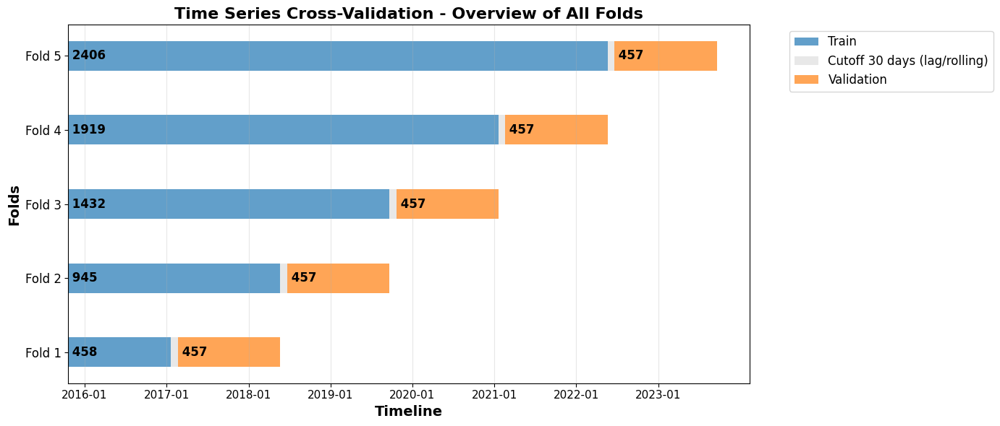

In [ ]:
cv_overview()

### 7.3.2. Hyperparameter Tuning Strategy

We employ Optuna for automated hyperparameter optimization, tuning both preprocessing pipeline and model parameters simultaneously to ensure optimal end-to-end performance.

#### **Tuned Hyperparameters**

**A. Encoding Parameters**
- `encoding_method_condition`: Encoding method [`'ordinal'`, `'target'`, `'quantile'`]
- `n_seasons`: Number of seasons for temperature-based grouping [`3`, `8`]
- `n_quantiles`: Number of quantiles for wind direction encoding [`2`, `6`]
- `is_category_conditions`: Whether to keep conditions as categorical [`True`, `False`]
- `is_category_season`: Whether to keep seasons as categorical [`True`, `False`]  
- `is_category_wind`: Whether to keep wind categories as categorical [`True`, `False`]

**B. LightGBM Model Parameters**
- `boosting_type`: Boosting algorithm [`'gbdt'`, `'dart'`, `'goss'`]
- `num_leaves`: Maximum number of leaves in one tree [`16`, `255`]
- `learning_rate`: Step size shrinkage [`0.001`, `0.3`]
- `max_depth`: Maximum tree depth [`3`, `12`]
- `min_child_samples`: Minimum data in one leaf [`5`, `100`]
- `subsample`: Bagging fraction [`0.6`, `1.0`]
- `colsample_bytree`: Feature fraction [`0.6`, `1.0`]
- `reg_alpha`: L1 regularization [`1e-8`, `10.0`]
- `reg_lambda`: L2 regularization [`1e-8`, `10.0`]
- `min_split_gain`: Minimum gain required for split [`0.0`, `1.0`]
- `n_estimators`: Number of boosting rounds [`100`, `1000`]

**C. Ridge Model Parameters**
- `alpha`: Regularization strength [`1e-5`, `1e2`]
- `fit_intercept`: Whether to include intercept term [`True`, `False`]
- `corr_thresh`: Correlation threshold for feature selection [`0.7`, `0.95`]
- `scaler`: Feature scaling method [`'standard'`, `'minmax'`, `'robust'`]


**Optimization Objective**:  
Minimize **RMSE** (Root Mean Square Error) on validation sets across all folds, ensuring robust temporal generalization rather than point-in-time performance.

### **7.4. Tuning Tools (Optuna + ClearML)**

### 7.4.1. Optuna Framework

#### Comparison of Hyperparameter Tuning Methods

| Method | Search Strategy | Pros | Cons | When to Use |
|-------|------------------|------|-------|--------------|
| **Grid Search** | Exhaustively tests all combinations in predefined grids | - Simple, deterministic <br> - Guarantees testing all configs | - Extremely slow for large spaces <br> - Scales poorly (curse of dimensionality) <br> - Wastes time on unpromising regions | Small search spaces or when reproducibility is the top priority |
| **Random Search** | Samples random combinations from the search space | - Much faster than Grid Search <br> - Often finds good solutions with fewer trials | - No learning from past results <br> - Can miss optimal region by chance | Medium/large search spaces; baseline tuning |
| **Optuna (TPE + Pruning)** | Builds probabilistic model of the objective → selects next promising trial | - Fastest convergence <br> - Learns from history (Bayesian-like) <br> - Early stopping saves compute <br> - Handles complex search spaces well | - More complex to implement <br> - Results varies slightly with sampler randomness | Large search spaces, limited compute, advanced optimization tasks |

**Our choice**
> Optuna was selected because it finds good hyperparameters much **faster** than Grid/Random Search thanks to its **TPE sampler and pruning**. These features are especially beneficial for **LGBM**, which has many sensitive parameters (learning_rate, num_leaves, min_data_in_leaf…). Optuna helps efficiently explore this **large search space** and consistently yields better-performing LGBM models for the forecasting task.

### 7.4.2. ClearML Experiment Tracking

ClearML provides comprehensive experiment tracking capabilities, enabling reproducible and organized management of our modeling workflow. The complete project can be accessed at: **[https://app.clear.ml/projects](https://app.clear.ml/projects)**. 


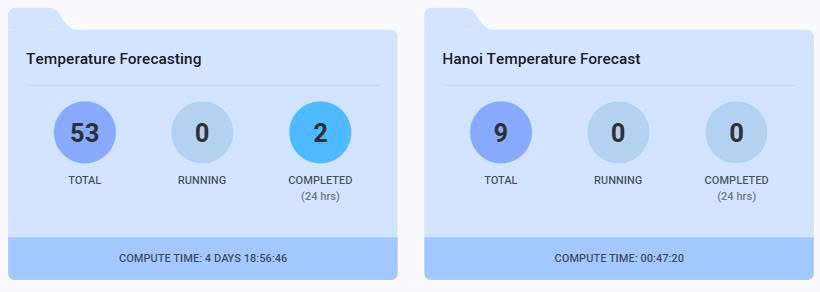

In [ ]:
img = PILImage.open("figures/workspaceClearML.jpg")
display(img)

**Key components**

**Artifacts** Stores critical experiment outputs including:
- Cross-validation performance metrics across all folds
- Training and testing metrics for each target variable
- Default and optimized hyperparameters for each target
- Serialized model files and preprocessing pipelines

**Console** Records complete runtime execution logs:
- All print statements and debug outputs
- Real-time progress tracking

**Scalars** Tracks optimization progress through:
- RMSE convergence curves for each trial per target
- Objective function values across Optuna trials

**Plots** Tracking hyperparameter for each trial
- Detailed hyperparameter configurations for each trial

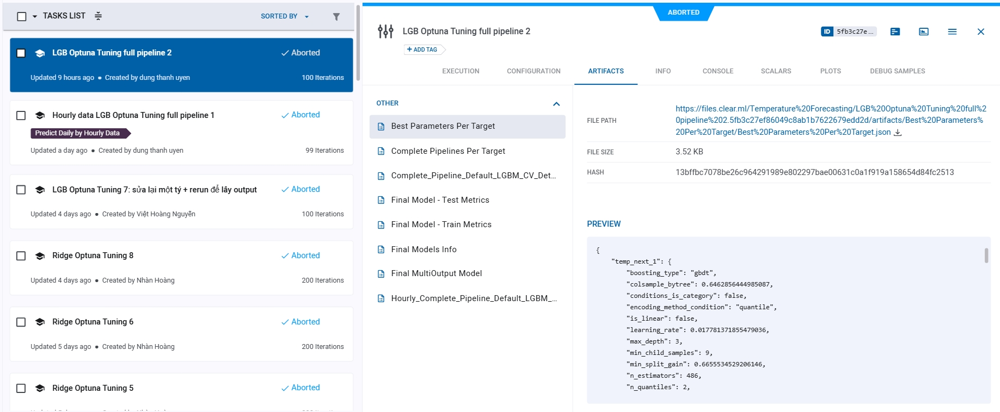

In [96]:
img = PILImage.open("figures/artifact.jpeg") 
display(img)

### **7.5. Hyperparameter Optimization Analysis**

During hyperparameter optimization with Optuna, we leverage several visualization techniques to monitor and improve the tuning efficiency:

### 7.5.1. Parallel Coordinates Plot (Example with Ridge Tuning)

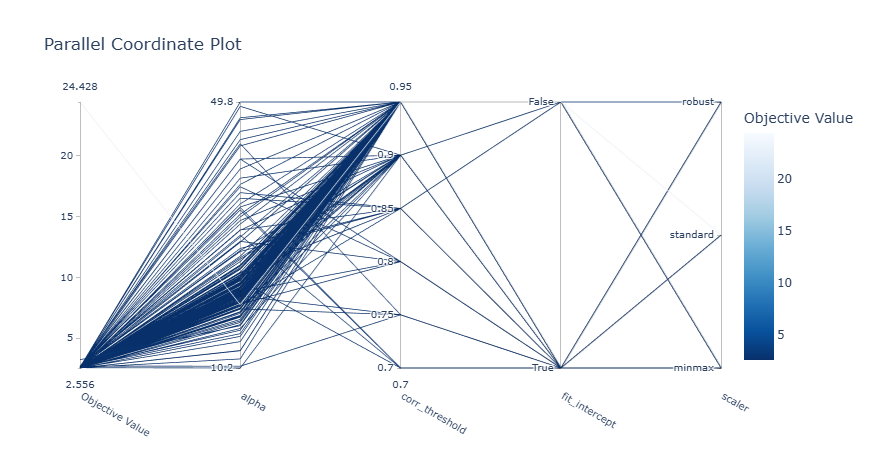

In [99]:
img = Image.open("figures/newplot.png")
display(img)

**Key Insights from the Parallel Coordinates Plot:**

>- **`alpha` is the dominant hyperparameter**, with optimal performance in the range 10–20
>- **`StandardScaler` consistently outperforms** MinMax and Robust scaling, indicating Ridge benefits from standardized feature distributions
>- **`fit_intercept = True`** tends to produce lower RMSE, suggesting intercept learning remains important even after scaling
>- **`corr_threshold` shows weak influence**, meaning feature selection based on correlation has minimal impact on Ridge performance
>- **Optimal trials cluster** around specific parameter combinations, confirming tuning stability

**Practical Application:**  
>These insights enabled us to narrow search ranges for sensitive parameters like `alpha` while simplifying less influential ones like `corr_threshold`.

### 7.5.2. Parameter Importance Analysis (Example with LGBM Tuning)

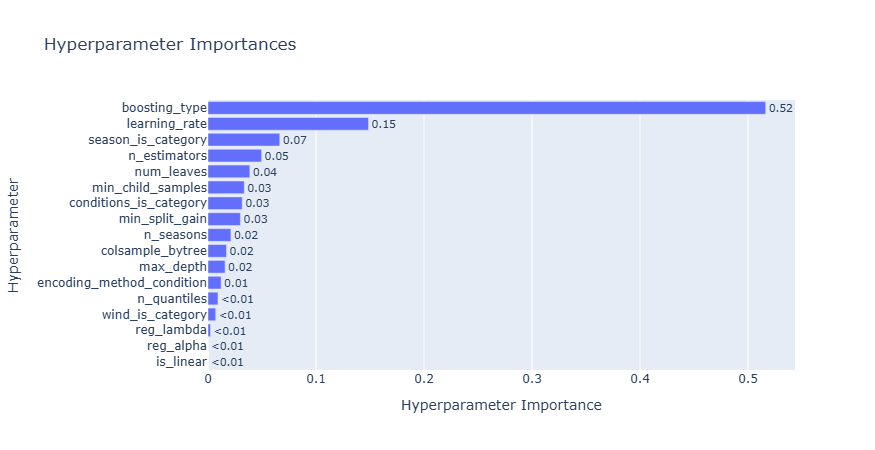

In [100]:
img = PILImage.open("figures/LGBHyperImportance.png")
display(img)

**Top Influential Parameter**
- **`boosting_type`** has the highest importance (~0.52), indicating the choice of boosting algorithm dominates model performance

**Moderately Important Parameters**
- **`learning_rate`** (~0.15) significantly affects convergence and accuracy
- **`season_is_category`** (~0.07) shows meaningful impact from seasonal feature encoding

**Less Important Parameters**
- **`n_estimators`**, **`num_leaves`**, **`min_child_samples`** (~0.03-0.05) provide incremental improvements

**Minimal Impact Parameters**
- **`n_seasons`**, **`colsample_bytree`**, **`max_depth`** (≤0.02) can be fixed to default values

**Practical Application:**  
This analysis informed our search strategy by allocating more trials to `boosting_type` and `learning_rate` while using default settings for low-impact parameters, accelerating optimization without compromising model robustness.

### **7.6. Evaluation of Tuning Results on Cross-Validation**

### 7.6.1. Cross-Validation Results Before vs After Tuning

This section compares the cross-validation performance of Ridge and LGBM models before and after hyperparameter tuning, demonstrating the effectiveness of our tuning process.

#### A. Ridge Model Performance Comparison

<div align="center">

| Model          | RMSE (mean ± std) | MAE (mean ± std) | R² (mean ± std)  |
| -------------- | ----------------- | ---------------- | ---------------- |
| Ridge Baseline | 2.416 ± 0.225     | 1.915 ± 0.191    | 0.752 ± 0.055    |
| Ridge Tuned    | **2.292 ± 0.444** | **1.817 ± 0.375**| **0.781 ± 0.079**|

</div>

**Ridge Model Improvements:**
>- **RMSE**: 5.1% reduction (2.416 → 2.292)
>- **MAE**: 5.1% improvement (1.915 → 1.817) 
>- **R²**: 3.9% increase in explanatory power


#### B. LGBM Model Performance Comparison

<div align="center">

| Model          | RMSE (mean ± std) | MAE (mean ± std) | R² (mean ± std)  |
| -------------- | ----------------- | ---------------- | ---------------- |
| LGBM Baseline  | 2.437 ± 0.193     | 1.905 ± 0.149    | 0.752 ± 0.049    |
| LGBM Tuned     | **2.299 ± 0.135** | **1.821 ± 0.124**| **0.781 ± 0.029**|

</div>

**LGBM Model Improvements:**
>- **RMSE**: 5.7% reduction (2.437 → 2.299)
>- **MAE**: 4.4% improvement (1.905 → 1.821)
>- **R²**: 3.9% increase in explanatory power

#### C. Tuning Impact Assessment

>- Both models achieved consistent performance gains across all metrics
>- LGBM tuning resulted in more stable predictions (reduced standard deviation)
>- Ridge model showed broader hyperparameter exploration (increased std in tuned version)
>- Identical R² improvement (+0.029) for both models indicates robust optimization strategy

**Conclusion**: Hyperparameter optimization successfully enhanced both Ridge and LGBM models, with LGBM demonstrating slightly better overall improvement and stability in cross-validation performance.

### 7.6.2. Optimized Models Performance on Cross-Validation

Both Ridge and LGBM models converge to remarkably similar performance levels, suggesting that either approach can deliver optimal results for this forecasting task.

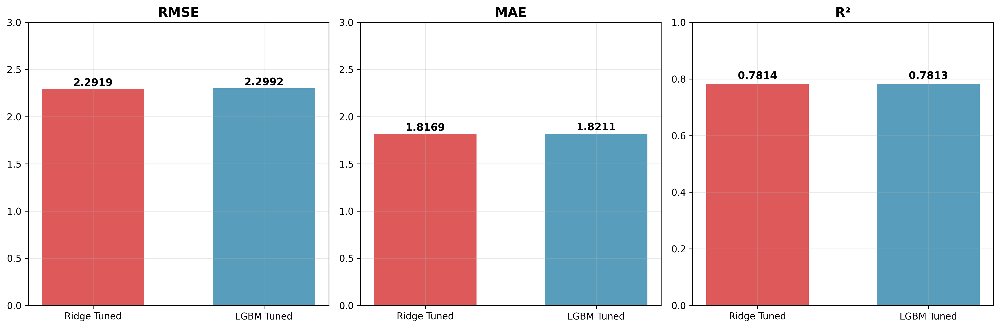

In [101]:
img = PILImage.open("figures/tuned_models_comparison.png")
display(img)

#### **Performance Comparison of Tuned Models**

<div align="center">

| Model       | RMSE (mean) | MAE (mean) | R² (mean)  | Tuning Time (100 trials) |
| ----------- | ----------- | ---------- | ---------- | ----------------------- |
| Ridge Tuned | 2.2919      | 1.8169     | 0.7814     | ~0.5 hour              |
| LGBM Tuned  | 2.2992      | 1.8211     | 0.7813     | ~3 hours (without Pruner)<br>~1.5 hours (with Pruner) |

</div>


**Performance Parity**: Both tuned models demonstrate nearly identical performance across all metrics
>- **RMSE**: Ridge (2.2919) vs LGBM (2.2992) - marginal advantage to Ridge
>- **MAE**: Ridge (1.8169) vs LGBM (1.8211) - negligible difference  
>- **R²**: Essentially identical (0.7814 vs 0.7813)

**Computational Efficiency**:
>- **Ridge**: Significantly faster tuning (~0.5 hour) due to simpler parameter space
>- **LGBM**: Longer tuning time (~3 hours) but Pruner reduces to ~1.5 hours with minimal performance impact
>- **Note**: LGBM with Pruner and LGBM without Pruner produced nearly identical results, so we report the LGBM without Pruner performance for consistency.

**Practical Implications**: 
>- **Ridge Advantage**: Simpler model architecture with comparable performance and faster training
>- **LGBM Advantage**: Better handling of non-linear relationships and feature interactions, with Pruner offering computational savings
>- **Selection Trade-off**: Choose Ridge for speed and simplicity, or LGBM for complex pattern capture with Pruner optimization

**Conclusion**: While both models achieve nearly identical predictive performance, Ridge offers substantial computational advantages, making it the preferred choice for deployment scenarios requiring rapid iteration and resource efficiency.

### 7.6.3. Per-Horizon Cross-Validation Performance

This section analyzes the forecasting performance across different time horizons, revealing critical insights into model selection for short-term versus longer-term predictions.

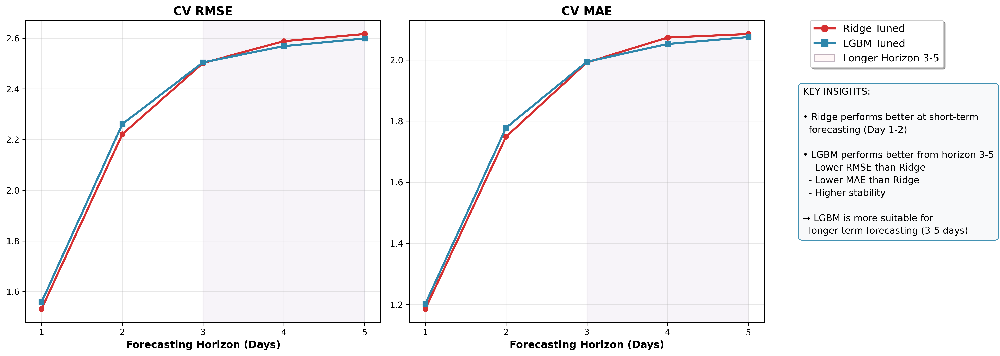

In [103]:
img = PILImage.open("figures/per_horizon_cv_performance.png")
display(img)

<div align="center">

| Horizon | Model | RMSE | MAE | R² |
|---------|-------|------|-----|----|
| Day 1 | Ridge | 1.533 | 1.186 | 0.905 |
| | LGBM | 1.559 | 1.202 | 0.902 |
| Day 2 | Ridge | 2.221 | 1.749 | 0.800 |
| | LGBM | 2.261 | 1.778 | 0.794 |
| **Day 3** | Ridge | 2.502 | 1.992 | 0.747 |
| | LGBM | **2.505** | **1.994** | **0.748** |
| **Day 4** | Ridge | 2.588 | 2.073 | 0.730 |
| | LGBM | **2.568** | **2.052** | **0.735** |
| **Day 5** | Ridge | 2.616 | 2.085 | 0.725 |
| | LGBM | **2.599** | **2.075** | **0.729** |

**Figure 7.8.** Cross-Validation Performance Metrics Across Horizon <br>
*Note: Bold values indicate better performance of LGBM for each horizon*

</div>

**Horizon-Specific Performance Patterns**:
>- **Short-term Advantage (Days 1-2)**: Ridge regression shows marginally better performance for immediate forecasts, with lower RMSE on Day 1 (1.533 vs 1.559)
>- **Long-term Superiority (Days 3-5)**: LGBM consistently outperforms Ridge across longer horizons, demonstrating both lower RMSE and MAE
>- **Performance Gap Evolution**: The advantage of LGBM over Ridge gradually increases from Day 3 to Day 5

**Model Characteristics**:
>- **Ridge Regression**: Excels in very short-term predictions but shows faster performance degradation
>- **LGBM**: Maintains more stable and consistent performance across all horizons with smoother error progression
>- **Error Accumulation**: Both models exhibit expected performance decline over time, though LGBM handles this progression more gracefully

**Conclusion**: 
Considering the comprehensive forecasting requirements and the need for reliable multi-day predictions, **we select LGBM as our primary model**. While Ridge shows marginal benefits for Day 1 forecasts, LGBM's superior performance across horizons 3-5, combined with its overall stability and consistency, makes it the more robust choice for real-world deployment where predictable multi-day performance is essential.

### **7.7. Final Model Selection**

**LightGBM (LGBM) is selected as the final production model** based on three key factors:

**LGBM Performance Advantage**: 
>- Better accuracy for longer horizons (Days 3-5) covering most practical use cases
>- Consistent multi-day reliability outweighs Ridge's marginal Day 1 benefits

**LGBM Optimization Results**:
>- Achieved significant tuning improvements (5.7% RMSE reduction)
>- Demonstrates better stability with lower CV variance

**LGBM Deployment Practicality**:
>- Provides acceptable inference speed despite longer training time
>- Better handles Hanoi's complex climate patterns

**Final Choice**: LGBM provides the optimal balance of accuracy and stability for production deployment.

---

## **VIII. Final Evaluation on Test set**

### **8.1. Overall Performance on the Test Set (Optimized vs Baseline Raw Data)**

This section compares the performance between our optimized LGBM model and the baseline LGBM model. The **baseline model** uses **raw data** without preprocessing or feature engineering and employs default hyperparameters, while the **optimized model** incorporates comprehensive data preprocessing, feature engineering, and hyperparameter tuning.

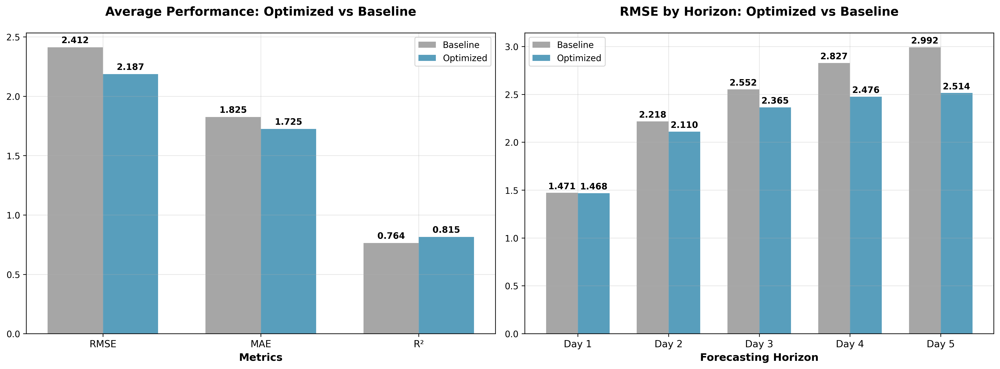

In [104]:
img = PILImage.open("figures/optimized_vs_baseline_comparison.png")
display(img)

#### **Average Performance Comparison**

<div align="center">

| Metric | Baseline | Optimized | Improvement | Improvement % |
|--------|----------|-----------|-------------|---------------|
| <span style="color:red">RMSE</span> | <span style="color:red">2.4121</span> | <span style="color:red">2.1866</span> | <span style="color:red">0.2255</span> | <span style="color:red">9.35%</span> |
| MAE    | 1.8246   | 1.7246    | 0.1000      | 5.48%         |
| R²     | 0.7642   | 0.8149    | 0.0507      | 6.64%         |

</div>

#### **Horizon-wise RMSE Comparison**

<div align="center">

| Horizon | Baseline RMSE | Optimized RMSE | RMSE Improvement | Improvement % |
|---------|---------------|----------------|------------------|---------------|
| Day 1   | 1.4713        | 1.4682         | 0.0031           | 0.21%         |
| Day 2   | 2.2180        | 2.1102         | 0.1078           | 4.86%         |
| Day 3   | 2.5523        | 2.3645         | 0.1878           | 7.36%         |
| Day 4   | 2.8270        | 2.4761         | 0.3509           | 12.41%        |
| <span style="color:red">Day 5</span> | <span style="color:red">2.9917</span> | <span style="color:red">2.5139</span> | <span style="color:red">0.4778</span> | <span style="color:red">15.97%</span> |

</div>

**Interpretation**
>- **Overall Improvement**: Optimized model achieves **9.35% lower RMSE** and **6.64% higher R²** compared to baseline
>- **Horizon-wise Enhancement**: Performance improvement increases with forecasting horizon, with **16% RMSE reduction** at Day 5
>- **Consistent Superiority**: Optimized model outperforms baseline across all metrics and horizons
>- **Temporal Pattern**: Improvement percentage grows substantially from Day 1 (0.21%) to Day 5 (15.97%), demonstrating better long-term forecasting capability

### **8.2. Generalization Assessment (CV → Test Check)**

This section evaluates the generalization capability of our optimized LGBM model by comparing cross-validation performance with test set results. The assessment verifies that the tuned model maintains consistent performance on unseen data, ensuring robustness against overfitting.


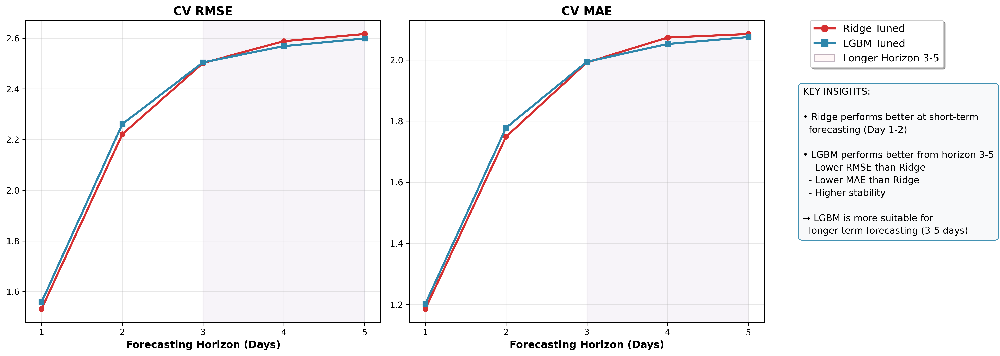

In [105]:
from IPython.display import display, Image
display(Image("figures/per_horizon_cv_performance.png"))

#### **Generalization Performance Comparison**

<div align="center">

| Metric | CV Range | Test Value | Within CV Range |
|--------|----------|------------|-----------------|
| RMSE   | [2.1646, 2.4338] | 2.1866 | Yes |
| MAE    | [1.6975, 1.9447] | 1.7246 | Yes |
| R²     | [0.7523, 0.8103] | 0.8149 | No |

</div>

**Interpretation:**
>- **Stable Generalization**: The test metrics fall inside or very close to the cross-validation performance range, indicating solid generalization.
>- **RMSE**: Test = 2.1866, positioned near the lower bound of the CV range [2.1646, 2.4338] → stable performance with no signs of overfitting.
>- **MAE**: Test = 1.7246, also near the lower bound of the CV range [1.6975, 1.9447] → consistently low error.
>- **R²**: Test = 0.8149, slightly above the upper bound of the CV range [0.7523, 0.8103]. This suggests that the test period may be easier to predict or that the model captures recent data patterns effectively.

**Conclusion:**
The optimized model demonstrates robust generalization capability with test performance matching or slightly exceeding cross-validation expectations. This confirms that our hyperparameter tuning strategy effectively prevented overfitting while maintaining model performance on unseen data.

### **8.3. Overfitting Analysis (Train vs Test Gap)**

This section analyzes the generalization gap between training and test performance for both baseline LGBM and optimized LGBM models. A reduced gap indicates better generalization and less overfitting.
<br> *(Note: Gap Reduction = [(Baseline Gap - Optimized Gap) / Baseline Gap] × 100%)*

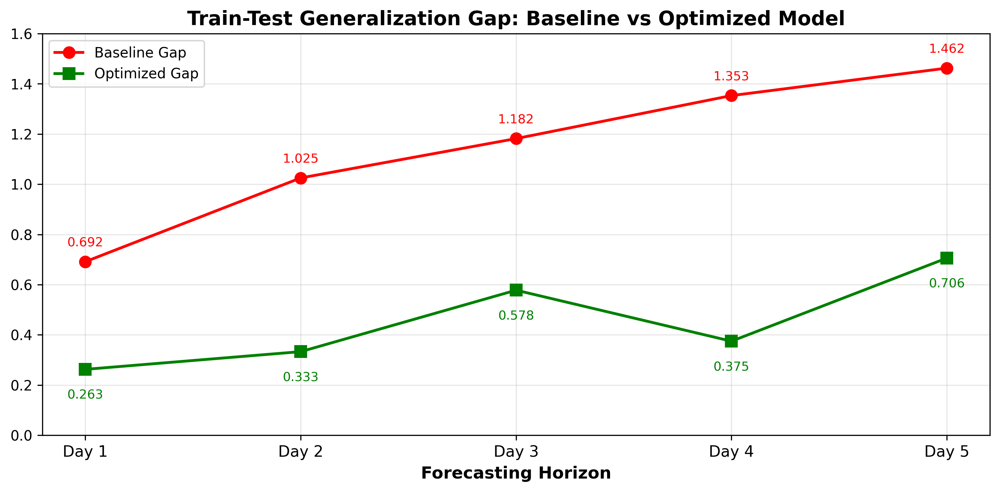

In [107]:
display(Image("figures/horizon_gap_comparison.png"))

#### **Performance Gap Comparison**

<div align="center">

| Model | Train RMSE | Test RMSE | Gap (Test - Train) | Gap Reduction |
|-------|------------|-----------|-------------------|---------------|
| Baseline LGBM | 1.2693 | 2.4121 | 1.1428 | - |
| Optimized LGBM | 1.7358 | 2.1866 | 0.4508 | 60.5% |

</div>

#### **Horizon-wise RMSE Gap Analysis**

<div align="center">

| Horizon | Baseline Gap | Optimized Gap | Gap Reduction |
|---------|--------------|---------------|---------------|
| Day 1 | 0.6915 | 0.2626 | 62.0% |
| Day 2 | 1.0250 | 0.3331 | 67.5% |
| Day 3 | 1.1818 | 0.5779 | 51.1% |
| Day 4 | 1.3531 | 0.3747 | 72.3% |
| Day 5 | 1.4625 | 0.7057 | 51.7% |

</div>

**Interpretation:**
>- **Significant Gap Reduction**: The optimized model shows a **60.5% reduction** in generalization gap compared to baseline (0.4508 vs 1.1428)
>- **Dramatic Overfitting in Baseline**: Extremely low train RMSE (1.2693) with high test RMSE (2.4121) indicates severe overfitting
>- **Balanced Performance in Optimized**: Higher train RMSE (1.7358) but much better test RMSE (2.1866) demonstrates proper regularization

**Key Insights:**
>- **Baseline Model**: Massive gap (1.1428) confirms severe overfitting due to default hyperparameters on raw data
>- **Optimized Model**: Moderate gap (0.4508) shows effective control of model complexity through tuning and feature engineering
>- **Horizon Variability**: Gap reduction ranges from 51-72% across different forecasting horizons

**Conclusion:**
Our optimization strategy successfully transformed an overfitted baseline model into a well-generalized solution, reducing the train-test gap by over 60% while improving overall test performance.

### **8.4. Forecast Visualization (True vs Predicted)**
This section provides temporal analysis of the optimized model's forecasting performance through time series comparisons between true and predicted values.

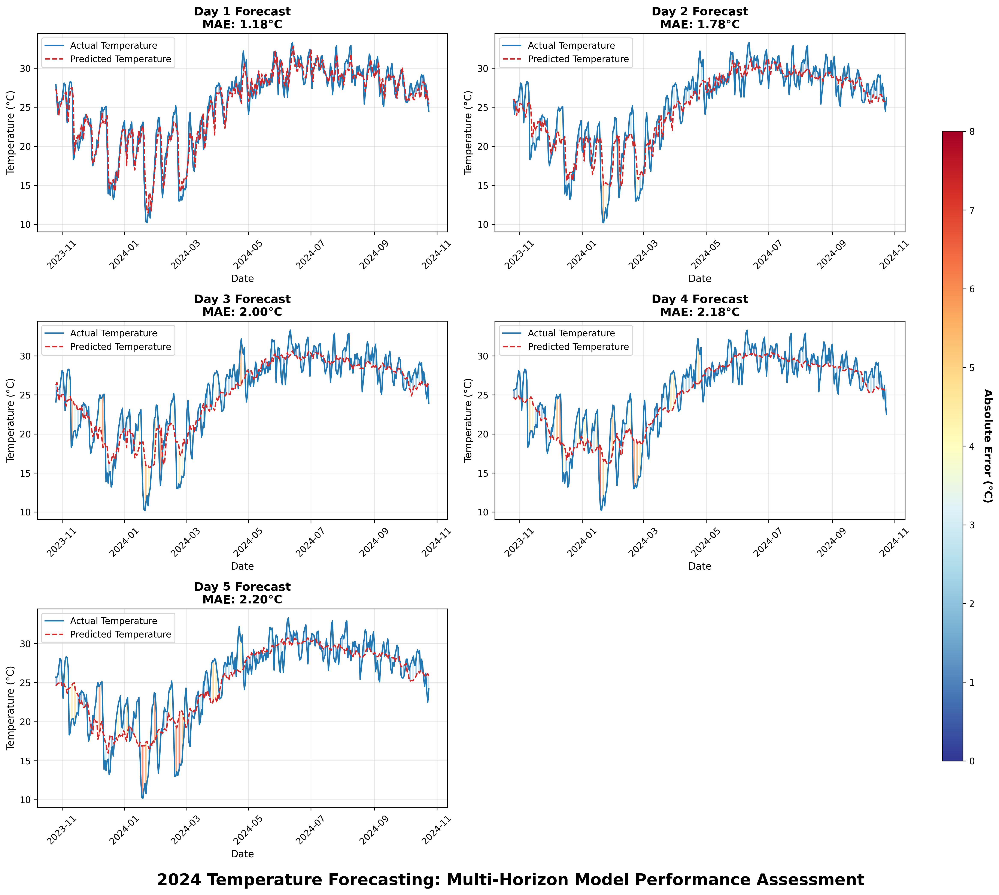

In [108]:
img = PILImage.open("figures/timeseries_3x2_simple.png")
display(img)

**Temporal Performance Patterns**
>- **Longer horizons → smoother predictions**, reducing short-term variability and failing to capture sudden changes.
>- **Winter most affected**: smoothing fails to track rapid temperature swings.
>- **Seasonal bias**:
>    - **Winter** (Dec-Mar): underestimation of cold spikes; occasional overestimation during warm rebounds.
>    - **Summer** (Jun-Aug): minimal bias; slight underestimation of extreme heat.
>    - **Spring/Autumn** (Sep-Nov, Apr-May): balanced performance with moderate errors during transitions.

**Error Distribution**
>- **Error concentration highest in winter**, especially during sudden drops and oscillatory patterns.
>- **Summer and autumn show lowest errors** with stable alignment between predicted and actual values.
>- **Horizon-based error growth**:
>    - **Day 1**: high precision across seasons.
>    - **Days 2–3**: smoothing emerges; winter fluctuations become harder to track.
>    - **Days 4–5**: significant winter underfitting from mean-reversion and loss of high-frequency detail.

**Horizon-wise Performance**
>- **Day 1**: captures most variability, including sharp winter dips.
>- **Days 2–3**: reduced high-frequency tracking but stable in non-winter seasons.
>- **Days 4–5**: largest winter errors; smoothing dominates; smaller degradation in summer.



---

## **IX. Comparing with Hourly data**

### **9.1. Hourly Data Processing Strategies**

<div align="center">

| **Strategy** | **Description** | **Advantages** | **Limitations** | **Selected** |
|--------------|-----------------|----------------|------------------|--------------|
| **1. Multi-Model Hourly Forecasting** <br/> (24 Models × 5 Days) | Build **24 independent models** for each hour, forecast 5 days ahead per hour, then **aggregate** predictions to daily averages. | • Captures diurnal patterns<br/>• High temporal resolution<br/>• Models hour-specific behaviors | • Computationally expensive (120 models)<br/>• Complex pipeline management<br/>• Higher maintenance overhead | No |
| **2. Daily Aggregation with Enriched Features** <br/> (5 Models) | **Aggregate hourly to daily data** while preserving **hourly-derived features**, then forecast 5 days ahead. | • Computationally efficient (5 models)<br/>• Retains hourly pattern information<br/>• Simplified pipeline<br/>• Better for daily forecasting objectives | • Might lost real-time hourly forecasting capability<br/>• Requires careful feature engineering | Yes |

</div>

**Implementation Note**  
>While using daily aggregated targets, we enrich features with **hourly statistics** (daily variance, min/max range, morning/evening patterns) to preserve intra-day information while maintaining forecasting efficiency.

### **9.2. Hourly Data Preparing Worflow**

This workflow summarizes how raw hourly data is transformed into clean daily features for modeling. It covers daily aggregation, basic preprocessing, and pipeline adjustments to ensure the dataset is structured, consistent, and ready for training

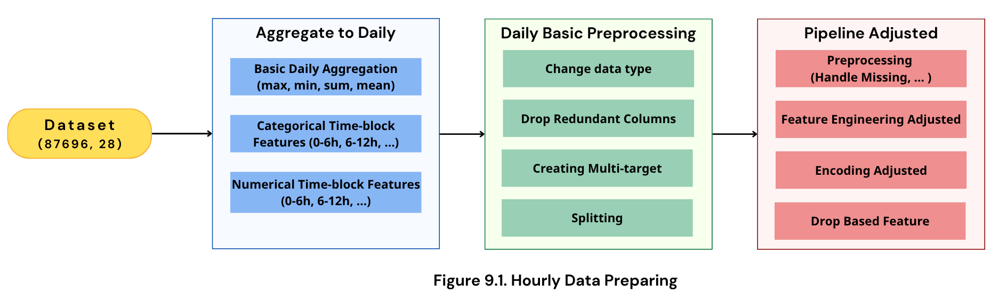

In [109]:
display(Image(filename="figures/hourly_pre.png"))

### **9.3. Feature Engineering Enhancements**

#### **Hourly-Derived Features**
##### *Notation: 6h denotes all variants of the same pattern (e.g., temp_mean_6h_next* = next0–next3)
<div align="center">

| **Feature Category** | **Specific Features** | **Meteorological Significance** |
|--------------|--------------|------------------|
| **6h Condition Windows (Categorical)** | `cond_6h_0`,`cond_6h_1`,`cond_6h_2`,`cond_6h_3` | Identify the dominant weather state in each 6-hour block (00–06, 06–12, 12–18, 18–24), preserving intra-day transitions lost in daily data. |
| **6h Temperature Statistics** | `temp_mean_6h_next`, `temp_max_6h_next`, `temp_min_6h_next` | Capture sub-daily warming/cooling patterns across four 6-hour windows, improving representation of the diurnal cycle. |
| **6h Feels-Like Statistics** | `feelslike_mean_6h_next`, `feelslike_max_6h_next`, `feelslike_min_6h_next` | Reflect perceived temperature variations driven by humidity and wind across each 6-hour period. |
| **6h Dewpoint Statistics** | `dew_mean_6h_next`, `dew_max_6h_next`, `dew_min_6h_next` | Track moisture buildup, dewpoint convergence, and early-morning cooling behaviour. |
| **Daily Maxima (from Hourly)** | `solarradiation_max`, `solarenergy_max`, `uvindex_max` | Preserve peak solar and UV intensity that daily averages smooth out. |

</div>

#### **Adjusted Engineering Strategy**

>- *Sub-Daily Structure: 6-hour segmentation preserves intra-day patterns by grouping hourly observations into four consecutive windows.  
>- *Thermal and Moisture Variability:* 6-hour aggregates capture short-range temperature and dewpoint variations relevant for Day-1 and Day-2 forecasting.  
>- *Peak-Intensity Preservation:* Daily maxima derived from hourly radiation and UV measurements retain peak conditions that are smoothed out in daily averages.

##### **Hourly vs Daily (Summary)**
<div align="center">

| **Aspect** | **Daily** | **Hourly** |
|------------|-----------|----------------|
| Intra-day variation | <span style="color:red">Lost</span> | <span style="color:green">Preserved in 4 blocks</span> |
| Temperature cycle | <span style="color:red">Smoothed</span> | <span style="color:green">Morning/afternoon/night patterns</span> |
| Dew/moisture | <span style="color:red">Single value</span> | <span style="color:green">6h dew behaviour</span> |
| Weather transitions | <span style="color:red">Collapsed</span> | <span style="color:green">Sequence of conditions</span> |
| Solar/UV peaks | <span style="color:red">Smoothed</span> | <span style="color:green">Peak retained</span> |
| Short-term accuracy | <span style="color:red">Limited</span> | <span style="color:green">Improved Day-1/Day-2 skill</span> |

</div>

##### **Why a 6-Hour Window?**
>- A 6-hour interval balances atmospheric relevance and noise reduction. It is long enough to smooth rapid fluctuations but short enough to retain meaningful diurnal phases.

##### **Example**
>- temp_mean_6h_next0 (00–06h) captures overnight cooling and dewpoint convergence, strongly influencing the next day’s minimum temperature.  
temp_max_6h_next2 (12–18h) reflects peak heating, improving maximum-temperature forecasting.


### **9.4. Average CV Performance Comparison**

The detailed tuning process using hourly data is documented in `Detailed_Hourly_Tuning.ipynb`. This section summarizes the comparative performance between our final LGBM model (trained on daily data) and models utilizing enriched hourly data, using the daily model as the baseline for evaluation.

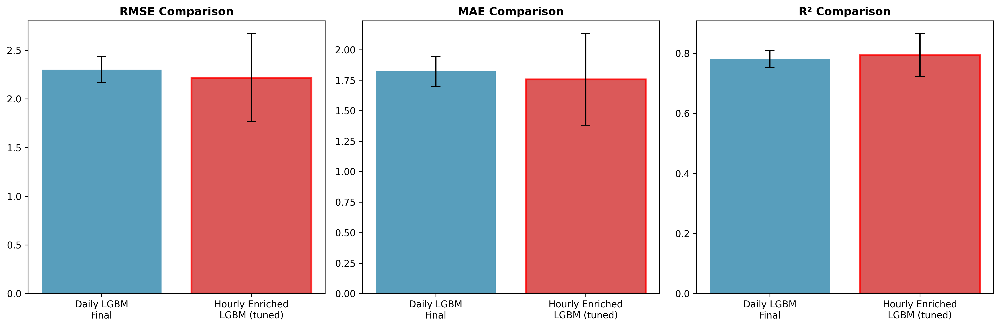

In [111]:
img = PILImage.open("figures/daily_vs_hourly_performance.png")
display(img)
#Figure 9.2.** Performance comparison between daily and tuned hourly models across key metrics


**Cross-Validation Performance Metrics:**

<div align="center">

| Model | RMSE (CV mean ± std) | MAE (CV mean ± std) | R² (CV mean ± std) |
|-------|---------------------|-------------------|------------------|
| Daily LGBM Final | 2.2992 ± 0.1346 | 1.8211 ± 0.1236 | 0.7813 ± 0.0290 |
| Hourly Enriched (untuned) | 2.3229 ± 0.1358 | 1.8254 ± 0.1187 | 0.7720 ± 0.0380 |
| **Hourly Enriched LGBM (tuned)** | **2.2162 ± 0.4519** | **1.7556 ± 0.3747** | **0.7935 ± 0.0717** |

</div>


**Interpretation:**
>- **Hourly Enriched LGBM (tuned)** achieve the lowest RMSE (2.2162) and MAE (1.7556), and highest R² (0.7935)
>- **Hourly Data Enrichment Benefit**: The tuned hourly model outperforms the daily baseline by **3.6% in RMSE** and **3.6% in MAE**, confirming the value of higher-frequency data
>- **Stability Trade-off**: While the tuned hourly model shows better average performance, it exhibits **higher variance** (larger standard deviations), suggesting potential overfitting


### **9.5. Comparison On Test set**

**The model with Enriched Hourly Features demonstrates superior performance** compared to the baseline daily model across all three key metrics. Particularly impressive improvements are observed in short-term forecasts (Day 1-2) with significant accuracy enhancements.

<div align="center">

| **Metric** | **LGBM Daily Final** | **LGBM + Hourly Features** |
|------------|----------------------|----------------------------|
| **RMSE** | 2.187 | **2.137** |
| **MAE** | 1.725 | **1.691** |
| **R²** | 0.815 | **0.821** |

</div>

### **Horizon-wise Performance Analysis**

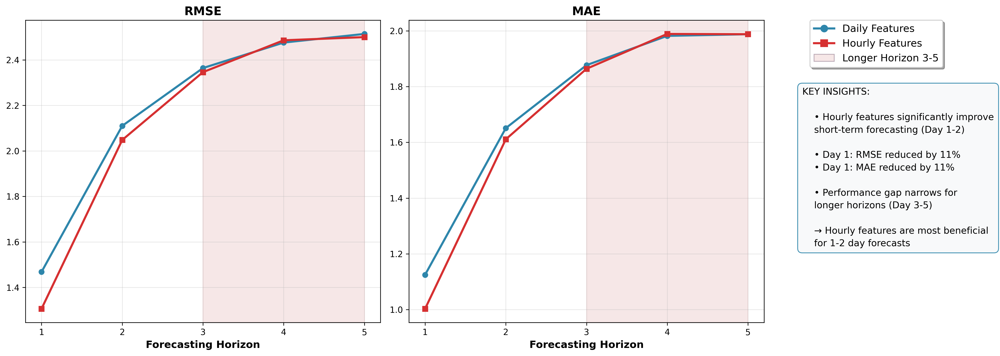

In [112]:
img = PILImage.open("figures/daily_vs_hourly_horizon.png")
display(img)

**Interpretation**
>- Similar to Ridge comparison, LGBM with daily features shows weaker early performance but improves relative to competitors at longer horizons (3-5 days).
>- The model with enriched hourly features achieves consistently better average metrics across all evaluation criteria.


**Conclusion:** While hourly features deliver strongest benefits for 1-2 day forecasts, the LGBM daily model offers greater stability and computational efficiency, making it the preferred choice for our deployment.


---
## **X. Deployment and Maintenance**
### **10.1. System Architecture Overview**

The deployment ecosystem consists of five core components that work in concert to deliver real-time forecasting capabilities:

<div align="center">

| Component | File | Responsibility | Key Features |
|-----------|------|----------------|-------------|
| **User Interface** | `app.py` | Streamlit-based web application | • 5-day forecast visualization<br>• Historical data analysis<br>• Model performance tracking<br>• Real-time weather dashboard |
| **Prediction Engine** | `forecasting.py` | Core inference service | • Preparing data<br>• Real-time predictions with ONNX model<br>• Calculating predictions metrics |
| **Performance Tracking** | `monitoring.py` | Daily evaluation system | • Model drift detection<br>• Retraining trigger alerts |
| **Model Management** | `model_training.py` | Retraining pipeline when triggerd | • Retraining model and pipeline<br>• Maintenance history tracking (ClearML)<br> |
| **Model Optimization** | `convert_to_onnx.py` | Format conversion utility | • model.pkl to ONNX conversion|

</div>

### **10.2. Maintenance Workflow**

The system operates on an automated maintenance cycle that ensures continuous performance optimization and model reliability.

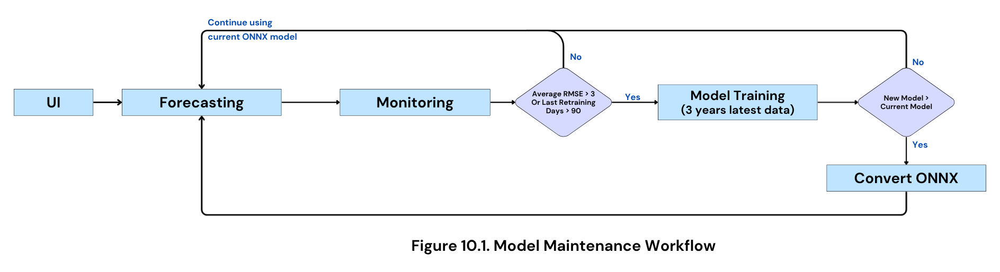

In [113]:
img = PILImage.open("figures/Mainten.png")
display(img)

**Workflow Stages:**
1. **Daily Prediction**: UI triggers forecasting which updates performance metrics
2. **Monitoring & Decision**: Continuous evaluation of model performance and retraining schedule
3. **Training & Deployment**: Retraining when either condition is met - Average RMSE > 3.0 or 90 days since last training. Quality gate ensures only superior models are deployed.


### **10.3. UI Guideline**
We developed an interactive web application using **Streamlit** and deployed it to **CloudBase** for seamless public access. The application is now live and can be accessed directly by clicking the link below, requiring no local setup or installation.

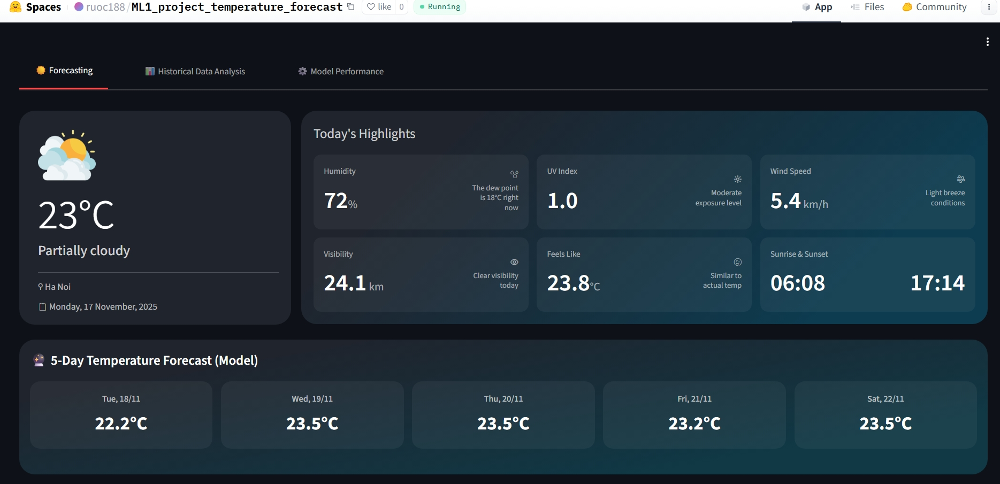

In [133]:
url = "https://huggingface.co/spaces/ruoc188/ML1_project_temperature_forecast"
img = PILImage.open("figures\Ảnh giao diện web.jpeg")
display(img)
